In [1]:
import pandas as pd
pd.set_option('display.max_columns', 500)

import numpy as np

import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')

import matplotlib.ticker as ticker

import seaborn as sns
sns.set_style('whitegrid')

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot

from sklearn import metrics

from sklearn.linear_model import LinearRegression

import warnings

import datetime
from datetime import timedelta, time
import statistics

import matplotlib.dates as mdates
from scipy.stats import pearsonr
%matplotlib inline

import tensorflow as tf
from tensorflow import keras
from pylab import rcParams
from matplotlib import rc
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
rcParams['figure.figsize'] = 16, 10

import matplotlib as mpl
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator  #must use this one for training with TimeSeriesGenerator
%matplotlib inline

2024-05-02 19:34:48.110690: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-02 19:34:48.110822: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-02 19:34:48.265621: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
data = pd.read_csv("/kaggle/input/consolidado/consolidado.csv", sep=";")

In [3]:
data.head()

,Fecha,Active_energy,Reactive_energy,Voltaje_FA,Voltaje_FC,Archivo
0,2021-01-01 00:00:00,0.357841,0.282788,455.139171,510.561002,DATOSCLIENTE1.csv
1,2021-01-01 01:00:00,0.372264,0.431377,469.978787,469.917178,DATOSCLIENTE1.csv
2,2021-01-01 02:00:00,1.044687,0.338626,468.721120,546.949147,DATOSCLIENTE1.csv
3,2021-01-01 03:00:00,0.566425,0.495791,452.329255,444.122989,DATOSCLIENTE1.csv
4,2021-01-01 04:00:00,1.080556,0.472018,513.477596,535.463719,DATOSCLIENTE1.csv


In [4]:
#Se filtran los clientes que tienen información completa del 99% en adelante
clientes = ["DATOSCLIENTE1.csv","DATOSCLIENTE2.csv","DATOSCLIENTE3.csv","DATOSCLIENTE4.csv",
            "DATOSCLIENTE5.csv","DATOSCLIENTE6.csv","DATOSCLIENTE7.csv","DATOSCLIENTE8.csv","DATOSCLIENTE9.csv",
            "DATOSCLIENTE10.csv","DATOSCLIENTE16.csv","DATOSCLIENTE17.csv","DATOSCLIENTE18.csv",
            "DATOSCLIENTE19.csv","DATOSCLIENTE20.csv"]

data = data[data['Archivo'].isin(clientes)]

In [5]:
# Realizar un describe por cada cliente
describe_por_cliente = data.groupby('Archivo').describe()

# Visualizar el resultado
print(describe_por_cliente)

                   Active_energy                                          \
                           count      mean       std       min       25%   
Archivo                                                                    
DATOSCLIENTE1.csv        19681.0  1.940788  1.449246  0.001715  1.197414   
DATOSCLIENTE10.csv       19681.0  3.545042  1.854900  0.011014  2.142763   
DATOSCLIENTE16.csv       19500.0  1.311767  1.664991  0.000052  0.301177   
DATOSCLIENTE17.csv       19500.0  1.279278  1.534596 -0.488248  0.327545   
DATOSCLIENTE18.csv       19500.0  1.418947  1.775841 -1.329018  0.339010   
DATOSCLIENTE19.csv       19500.0  1.129092  1.432507  0.127157  0.290365   
DATOSCLIENTE2.csv        19681.0  2.745060  1.368205  0.027246  2.105917   
DATOSCLIENTE20.csv       19500.0  1.081665  1.418084 -0.490206  0.231000   
DATOSCLIENTE3.csv        19681.0  2.341707  1.458767  0.001658  1.629029   
DATOSCLIENTE4.csv        19681.0  1.270241  1.395533  0.000240  0.588655   
DATOSCLIENTE

In [6]:
# Calcular la suma de valores nulos por cada cliente
sum_nulos_por_cliente = data.groupby('Archivo').apply(lambda x: x.isnull().sum())

# Visualizar el resultado
print(sum_nulos_por_cliente)

                    Fecha  Active_energy  Reactive_energy  Voltaje_FA  \
Archivo                                                                 
DATOSCLIENTE1.csv       0              0                0           0   
DATOSCLIENTE10.csv      0              0                0           0   
DATOSCLIENTE16.csv      0              0                0           0   
DATOSCLIENTE17.csv      0              0                0           0   
DATOSCLIENTE18.csv      0              0                0           0   
DATOSCLIENTE19.csv      0              0                0           0   
DATOSCLIENTE2.csv       0              0                0           0   
DATOSCLIENTE20.csv      0              0                0           0   
DATOSCLIENTE3.csv       0              0                0           0   
DATOSCLIENTE4.csv       0              0                0           0   
DATOSCLIENTE5.csv       0              0                0           0   
DATOSCLIENTE6.csv       0              0           

/tmp/ipykernel_33/1901634155.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sum_nulos_por_cliente = data.groupby('Archivo').apply(lambda x: x.isnull().sum())


In [7]:
data_clean = data.copy()
data_clean['Fecha_hora'] = pd.to_datetime(data_clean['Fecha'])
data_clean['Energia_activa'] = data_clean.Active_energy
data_clean['Energia_reactiva'] = data_clean.Reactive_energy
data_clean.drop('Active_energy', axis=1, inplace=True)
data_clean.drop('Reactive_energy', axis=1, inplace=True)
data_clean['Fecha'] = data_clean['Fecha_hora'].dt.date
data_clean['Hora'] = data_clean['Fecha_hora'].dt.time
dayname = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sabado', 'Domingo']
data_clean['Dia_semana'] = pd.to_datetime(data_clean['Fecha']).dt.dayofweek.apply(lambda x: dayname[x])

data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 294310 entries, 0 to 463424
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Fecha             294310 non-null  object        
 1   Voltaje_FA        294310 non-null  float64       
 2   Voltaje_FC        294310 non-null  float64       
 3   Archivo           294310 non-null  object        
 4   Fecha_hora        294310 non-null  datetime64[ns]
 5   Energia_activa    294310 non-null  float64       
 6   Energia_reactiva  294310 non-null  float64       
 7   Hora              294310 non-null  object        
 8   Dia_semana        294310 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 22.5+ MB


In [8]:
data_clean.head()

,Fecha,Voltaje_FA,Voltaje_FC,Archivo,Fecha_hora,Energia_activa,Energia_reactiva,Hora,Dia_semana
0,2021-01-01,455.139171,510.561002,DATOSCLIENTE1.csv,2021-01-01 00:00:00,0.357841,0.282788,00:00:00,Viernes
1,2021-01-01,469.978787,469.917178,DATOSCLIENTE1.csv,2021-01-01 01:00:00,0.372264,0.431377,01:00:00,Viernes
2,2021-01-01,468.721120,546.949147,DATOSCLIENTE1.csv,2021-01-01 02:00:00,1.044687,0.338626,02:00:00,Viernes
3,2021-01-01,452.329255,444.122989,DATOSCLIENTE1.csv,2021-01-01 03:00:00,0.566425,0.495791,03:00:00,Viernes
4,2021-01-01,513.477596,535.463719,DATOSCLIENTE1.csv,2021-01-01 04:00:00,1.080556,0.472018,04:00:00,Viernes


In [9]:
# Cleaning duplicates for each client
def clean_duplicates_by_client(df):
    # Group by 'Archivo' (cliente) and 'Datetime', and count occurrences
    datetime_counts = df.groupby(['Archivo', 'Fecha_hora']).size()

    # Filter to find where counts are greater than 1
    duplicates = datetime_counts[datetime_counts > 1]

    # Print the result for each client
    for client, counts in duplicates.groupby(level=0):
        print(f"Duplicados de {client}:")
        print(counts)
    # Check for clients without duplicates
    unique_clients = df['Archivo'].unique()
    for client in unique_clients:
        if client not in duplicates.index:
            print(f"No se encontraron duplicados para el {client}")

# Apply the function to the entire dataframe
clean_duplicates_by_client(data_clean)

No se encontraron duplicados para el DATOSCLIENTE1.csv
No se encontraron duplicados para el DATOSCLIENTE10.csv
No se encontraron duplicados para el DATOSCLIENTE16.csv
No se encontraron duplicados para el DATOSCLIENTE17.csv
No se encontraron duplicados para el DATOSCLIENTE18.csv
No se encontraron duplicados para el DATOSCLIENTE19.csv
No se encontraron duplicados para el DATOSCLIENTE2.csv
No se encontraron duplicados para el DATOSCLIENTE20.csv
No se encontraron duplicados para el DATOSCLIENTE3.csv
No se encontraron duplicados para el DATOSCLIENTE4.csv
No se encontraron duplicados para el DATOSCLIENTE5.csv
No se encontraron duplicados para el DATOSCLIENTE6.csv
No se encontraron duplicados para el DATOSCLIENTE7.csv
No se encontraron duplicados para el DATOSCLIENTE8.csv
No se encontraron duplicados para el DATOSCLIENTE9.csv


In [10]:
# Contar el tamaño de cada grupo por fecha para cada cliente
def count_by_date_for_each_client(df):
    # Iterar sobre cada cliente
    for client, group in df.groupby('Archivo'):
        # Imprimir el tamaño de cada grupo por fecha para el cliente actual
        print(f"Tamaño de cada grupo por fecha para el cliente {client}:")
        print(group.groupby("Fecha").size())

# Aplicar la función al dataframe completo
count_by_date_for_each_client(data_clean)

Tamaño de cada grupo por fecha para el cliente DATOSCLIENTE1.csv:
Fecha
2021-01-01    24
2021-01-02    24
2021-01-03    24
2021-01-04    24
2021-01-05    24
              ..
2023-03-28    24
2023-03-29    24
2023-03-30    24
2023-03-31    24
2023-04-01     1
Length: 821, dtype: int64
Tamaño de cada grupo por fecha para el cliente DATOSCLIENTE10.csv:
Fecha
2021-01-01    24
2021-01-02    24
2021-01-03    24
2021-01-04    24
2021-01-05    24
              ..
2023-03-28    24
2023-03-29    24
2023-03-30    24
2023-03-31    24
2023-04-01     1
Length: 821, dtype: int64
Tamaño de cada grupo por fecha para el cliente DATOSCLIENTE16.csv:
Fecha
2021-01-01    24
2021-01-02    24
2021-01-03    24
2021-01-04    24
2021-01-05    24
              ..
2023-03-20    24
2023-03-21    24
2023-03-22    24
2023-03-23    24
2023-03-24    12
Length: 813, dtype: int64
Tamaño de cada grupo por fecha para el cliente DATOSCLIENTE17.csv:
Fecha
2021-01-01    24
2021-01-02    24
2021-01-03    24
2021-01-04    24
20

In [11]:
# Función para contar el tamaño de cada grupo por hora para cada cliente
def count_by_time_for_each_client(df):
    # Iterar sobre cada cliente
    for client, group in df.groupby('Archivo'):
        # Imprimir el tamaño de cada grupo por hora para el cliente actual
        print(f"Tamaño de cada grupo por hora para el cliente {client}:")
        print(group.groupby("Hora").size())

# Aplicar la función al dataframe completo
count_by_time_for_each_client(data_clean)

Tamaño de cada grupo por hora para el cliente DATOSCLIENTE1.csv:
Hora
00:00:00    821
01:00:00    820
02:00:00    820
03:00:00    820
04:00:00    820
05:00:00    820
06:00:00    820
07:00:00    820
08:00:00    820
09:00:00    820
10:00:00    820
11:00:00    820
12:00:00    820
13:00:00    820
14:00:00    820
15:00:00    820
16:00:00    820
17:00:00    820
18:00:00    820
19:00:00    820
20:00:00    820
21:00:00    820
22:00:00    820
23:00:00    820
dtype: int64
Tamaño de cada grupo por hora para el cliente DATOSCLIENTE10.csv:
Hora
00:00:00    821
01:00:00    820
02:00:00    820
03:00:00    820
04:00:00    820
05:00:00    820
06:00:00    820
07:00:00    820
08:00:00    820
09:00:00    820
10:00:00    820
11:00:00    820
12:00:00    820
13:00:00    820
14:00:00    820
15:00:00    820
16:00:00    820
17:00:00    820
18:00:00    820
19:00:00    820
20:00:00    820
21:00:00    820
22:00:00    820
23:00:00    820
dtype: int64
Tamaño de cada grupo por hora para el cliente DATOSCLIENTE16.csv:

### Los clientes 1 al 10 deben tener 820 registros por hora. mientras el restante deben tener 813

In [12]:
from datetime import date as date_n

def number_of_days(date_1, date_2):
    return (date_2 - date_1).days + 1

# Función para calcular el número de días entre la fecha mínima y la fecha máxima para cada cliente
def calculate_days_for_each_client(df):
    # Iterar sobre cada cliente
    for client, group in df.groupby('Archivo'):
        # Calcular la fecha mínima y máxima para el cliente actual
        min_date = group['Fecha'].min()
        max_date = group['Fecha'].max()
        
        # Calcular el número de días entre la fecha mínima y la fecha máxima
        total_days = number_of_days(min_date, max_date)
        
        # Imprimir el resultado para el cliente actual
        print(f"Cliente: {client}, Fecha mínima: {min_date}, Fecha máxima: {max_date}, Número total de días: {total_days}")

# Aplicar la función al dataframe completo
calculate_days_for_each_client(data_clean)

Cliente: DATOSCLIENTE1.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-04-01, Número total de días: 821
Cliente: DATOSCLIENTE10.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-04-01, Número total de días: 821
Cliente: DATOSCLIENTE16.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-03-24, Número total de días: 813
Cliente: DATOSCLIENTE17.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-03-24, Número total de días: 813
Cliente: DATOSCLIENTE18.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-03-24, Número total de días: 813
Cliente: DATOSCLIENTE19.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-03-24, Número total de días: 813
Cliente: DATOSCLIENTE2.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-04-01, Número total de días: 821
Cliente: DATOSCLIENTE20.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-03-24, Número total de días: 813
Cliente: DATOSCLIENTE3.csv, Fecha mínima: 2021-01-01, Fecha máxima: 2023-04-01, Número total de días: 821
Cliente: DATOSCLIENTE4.csv, Fecha mínima

In [13]:
# Función para filtrar las fechas con menos de 24 registros por cliente
def filter_dates_below_24(df):
    # Iterar sobre cada cliente
    for client, group in df.groupby('Archivo'):
        # Group by 'Date' and count the records for each date
        grouped = group.groupby("Fecha").size()
        
        # Filter to get only those dates where the count is less than 24
        dates_below_24 = grouped[grouped < 24]
        
        # Imprimir los resultados para el cliente actual
        print(f"Cliente: {client}")
        print(dates_below_24)

# Aplicar la función al dataframe completo
filter_dates_below_24(data_clean)

Cliente: DATOSCLIENTE1.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE10.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE16.csv
Fecha
2023-03-24    12
dtype: int64
Cliente: DATOSCLIENTE17.csv
Fecha
2023-03-24    12
dtype: int64
Cliente: DATOSCLIENTE18.csv
Fecha
2023-03-24    12
dtype: int64
Cliente: DATOSCLIENTE19.csv
Fecha
2023-03-24    12
dtype: int64
Cliente: DATOSCLIENTE2.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE20.csv
Fecha
2023-03-24    12
dtype: int64
Cliente: DATOSCLIENTE3.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE4.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE5.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE6.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE7.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE8.csv
Fecha
2023-04-01    1
dtype: int64
Cliente: DATOSCLIENTE9.csv
Fecha
2023-04-01    1
dtype: int64


In [14]:
# Función para eliminar las fechas con menos de 24 registros por cliente
def remove_dates_below_24(df):
    # Lista para almacenar los índices de las filas a eliminar
    rows_to_drop = []
    
    # Iterar sobre cada cliente
    for client, group in df.groupby('Archivo'):
        # Group by 'Fecha' and count the records for each date
        grouped = group.groupby("Fecha").size()
        
        # Filtrar las fechas con menos de 24 registros
        dates_below_24 = grouped[grouped < 24]
        
        # Obtener los índices de las filas con esas fechas
        for date in dates_below_24.index:
            rows_to_drop.extend(group[group['Fecha'] == date].index)
    
    # Eliminar las filas con fechas que tienen menos de 24 registros
    df_cleaned = df.drop(rows_to_drop)
    
    return df_cleaned

# Aplicar la función al dataframe completo
data_clean_filtered = remove_dates_below_24(data_clean)

In [15]:
data_clean_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 294240 entries, 0 to 463423
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Fecha             294240 non-null  object        
 1   Voltaje_FA        294240 non-null  float64       
 2   Voltaje_FC        294240 non-null  float64       
 3   Archivo           294240 non-null  object        
 4   Fecha_hora        294240 non-null  datetime64[ns]
 5   Energia_activa    294240 non-null  float64       
 6   Energia_reactiva  294240 non-null  float64       
 7   Hora              294240 non-null  object        
 8   Dia_semana        294240 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 22.4+ MB


In [16]:
filter_dates_below_24(data_clean_filtered)

Cliente: DATOSCLIENTE1.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE10.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE16.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE17.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE18.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE19.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE2.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE20.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE3.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE4.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE5.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE6.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE7.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE8.csv
Series([], dtype: int64)
Cliente: DATOSCLIENTE9.csv
Series([], dtype: int64)


In [17]:
data_clean_filtered.groupby('Hora').size()

Hora
00:00:00    12260
01:00:00    12260
02:00:00    12260
03:00:00    12260
04:00:00    12260
05:00:00    12260
06:00:00    12260
07:00:00    12260
08:00:00    12260
09:00:00    12260
10:00:00    12260
11:00:00    12260
12:00:00    12260
13:00:00    12260
14:00:00    12260
15:00:00    12260
16:00:00    12260
17:00:00    12260
18:00:00    12260
19:00:00    12260
20:00:00    12260
21:00:00    12260
22:00:00    12260
23:00:00    12260
dtype: int64

In [18]:
data_clean_filtered.nunique()

Fecha                  820
Voltaje_FA          271586
Voltaje_FC          278145
Archivo                 15
Fecha_hora           19680
Energia_activa      255047
Energia_reactiva    262710
Hora                    24
Dia_semana               7
dtype: int64

In [19]:
# Función para convertir la columna 'Energia_activa' a tipo numérico para cada cliente
def convert_to_numeric_for_each_client(df):
    # Iterar sobre cada cliente
    for client, group in df.groupby('Archivo'):
        # Convertir la columna 'Energia_activa' a tipo numérico
        df.loc[group.index, 'Energia_activa'] = pd.to_numeric(group['Energia_activa'], errors='coerce')

# Aplicar la función al dataframe completo
convert_to_numeric_for_each_client(data_clean_filtered)

In [22]:
def calculate_hourly_mean_for_each_client(df):
    # Lista para almacenar los DataFrames de promedio por hora para cada cliente
    mean_dfs = []
    
    # Iterar sobre cada cliente
    for client, group in df.groupby('Archivo'):
        # Calcular el promedio de 'Energia_activa' para cada hora
        mean_hourly = group.groupby('Hora')['Energia_activa'].mean().reset_index()
        mean_hourly.columns = ['Hora', 'Average_Energia_activa']
        
        # Agregar el DataFrame de promedio por hora del cliente actual a la lista
        mean_hourly['Archivo'] = client  # Agregar columna "Archivo" con el nombre del cliente
        mean_dfs.append(mean_hourly)
    
    return mean_dfs

# Obtener los DataFrames de promedio por hora para cada cliente
mean_dfs_per_client = calculate_hourly_mean_for_each_client(data_clean_filtered)

# Imprimir los DataFrames de promedio por hora para cada cliente
for i, df_per_client in enumerate(mean_dfs_per_client):
    print(f"Promedio por hora para el cliente {df_per_client['Archivo'].iloc[0]}:")
    print(df_per_client)
    print()


Promedio por hora para el cliente DATOSCLIENTE1.csv:
        Hora  Average_Energia_activa            Archivo
0   00:00:00                1.974369  DATOSCLIENTE1.csv
1   01:00:00                1.770855  DATOSCLIENTE1.csv
2   02:00:00                1.618539  DATOSCLIENTE1.csv
3   03:00:00                1.836726  DATOSCLIENTE1.csv
4   04:00:00                1.946304  DATOSCLIENTE1.csv
5   05:00:00                1.987309  DATOSCLIENTE1.csv
6   06:00:00                1.991461  DATOSCLIENTE1.csv
7   07:00:00                2.002825  DATOSCLIENTE1.csv
8   08:00:00                2.004551  DATOSCLIENTE1.csv
9   09:00:00                2.031926  DATOSCLIENTE1.csv
10  10:00:00                2.037962  DATOSCLIENTE1.csv
11  11:00:00                2.023716  DATOSCLIENTE1.csv
12  12:00:00                2.006676  DATOSCLIENTE1.csv
13  13:00:00                1.766185  DATOSCLIENTE1.csv
14  14:00:00                1.628570  DATOSCLIENTE1.csv
15  15:00:00                1.864763  DATOSCLIENTE1

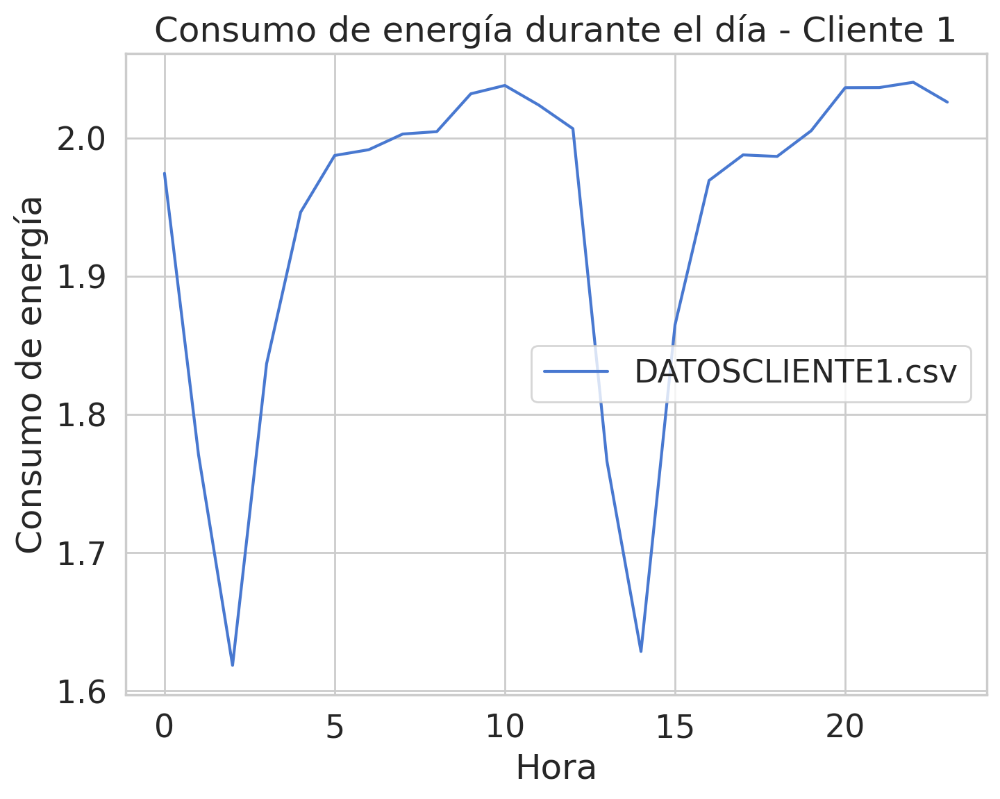

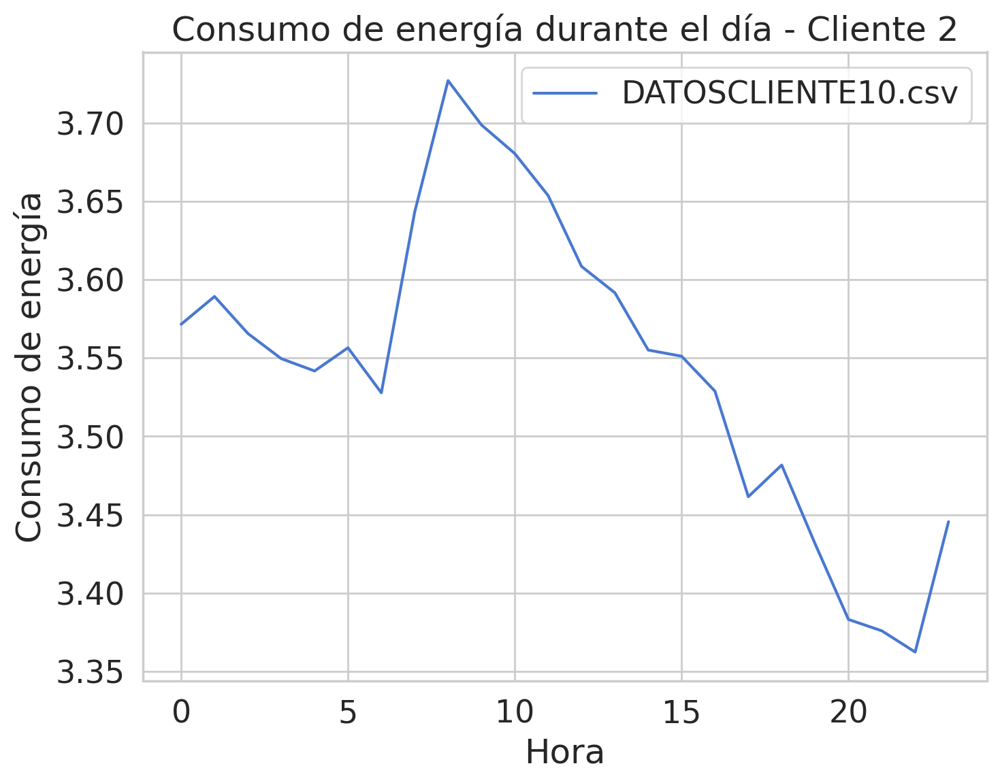

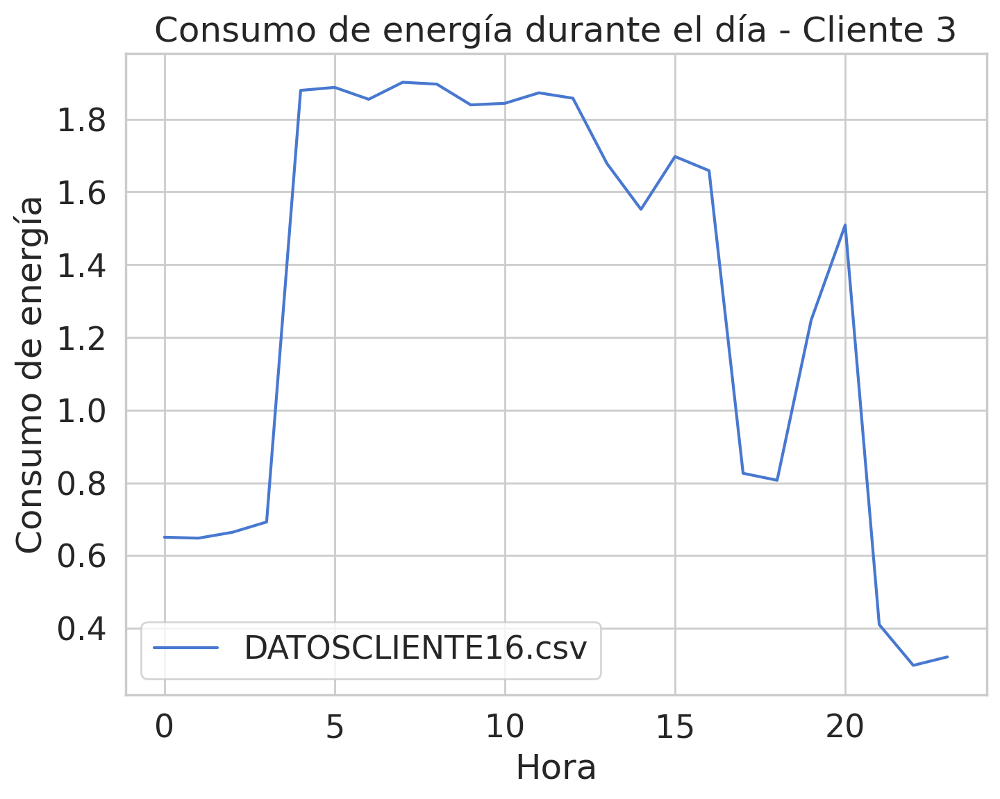

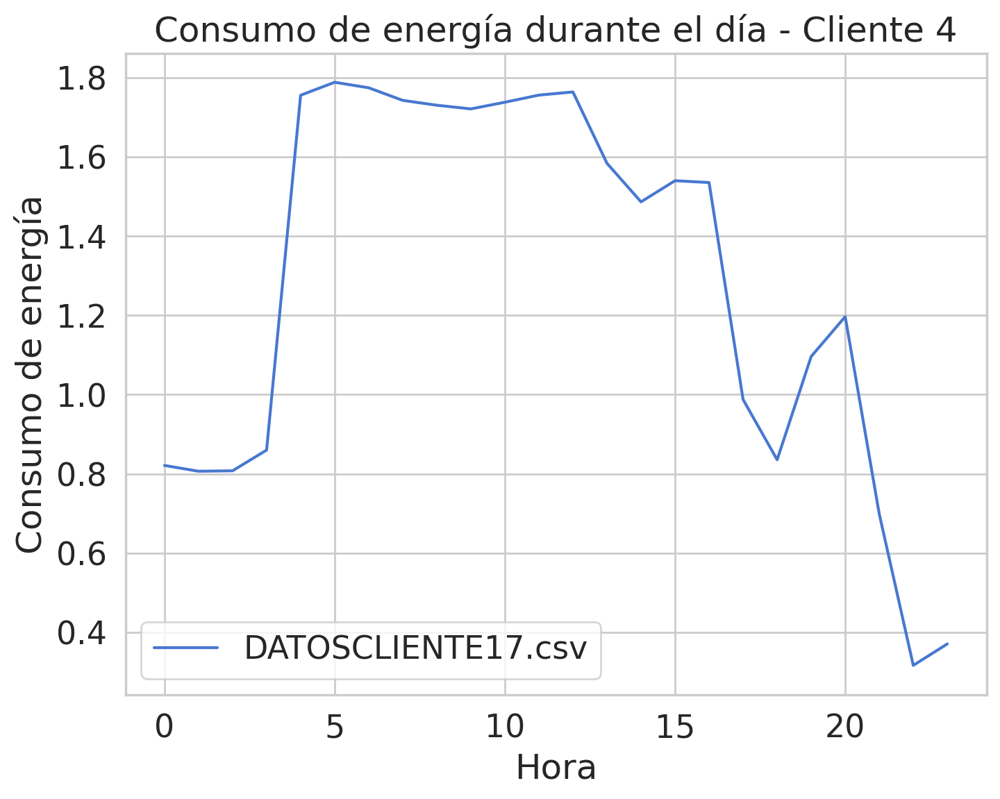

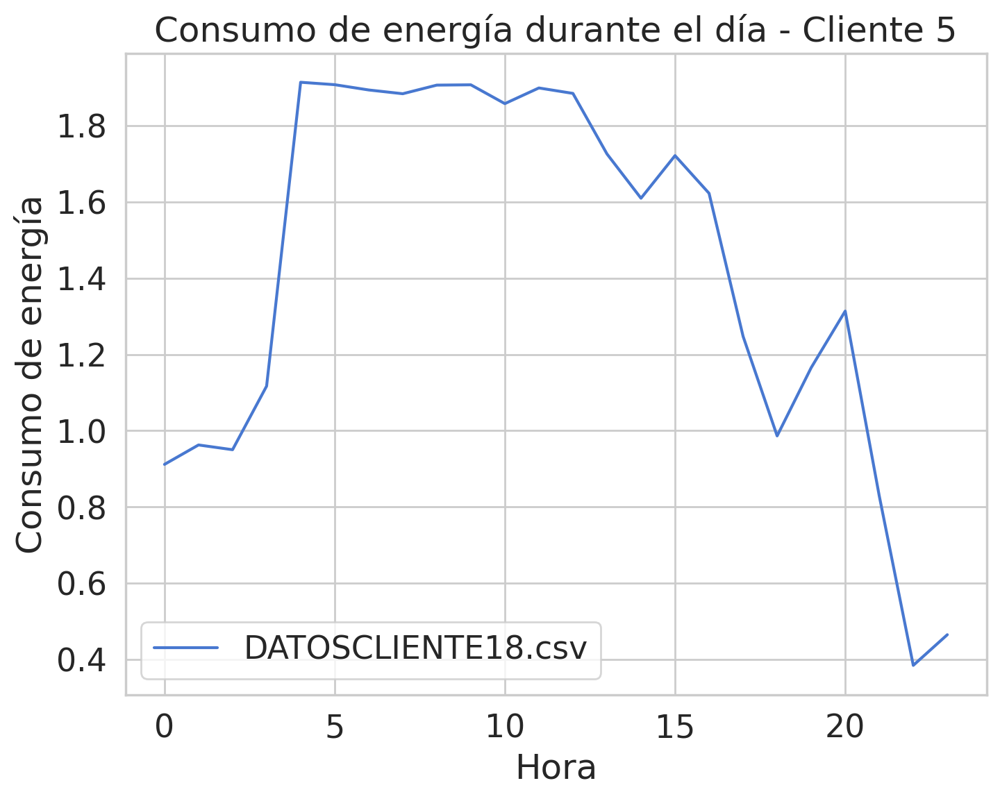

...

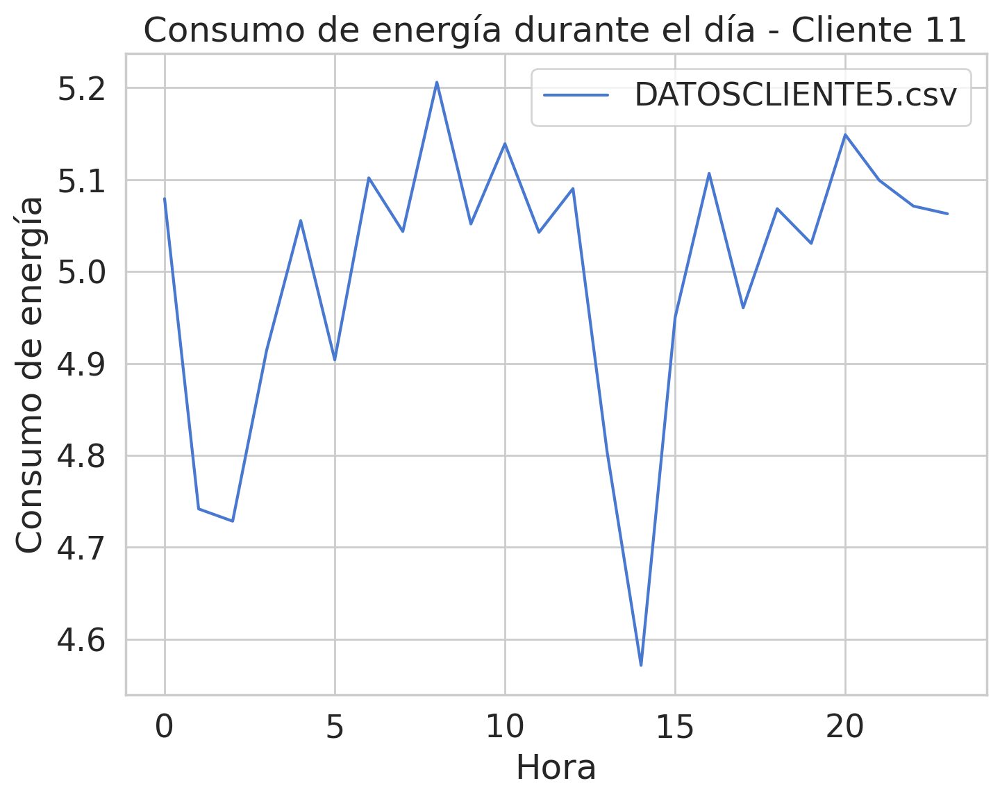

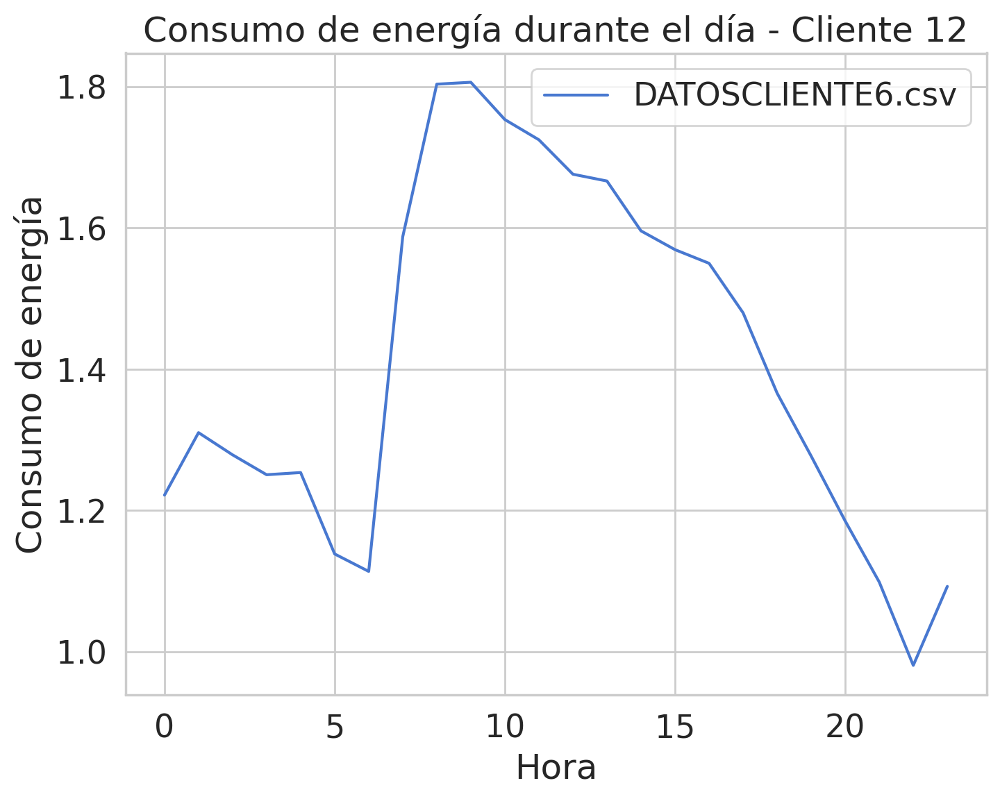

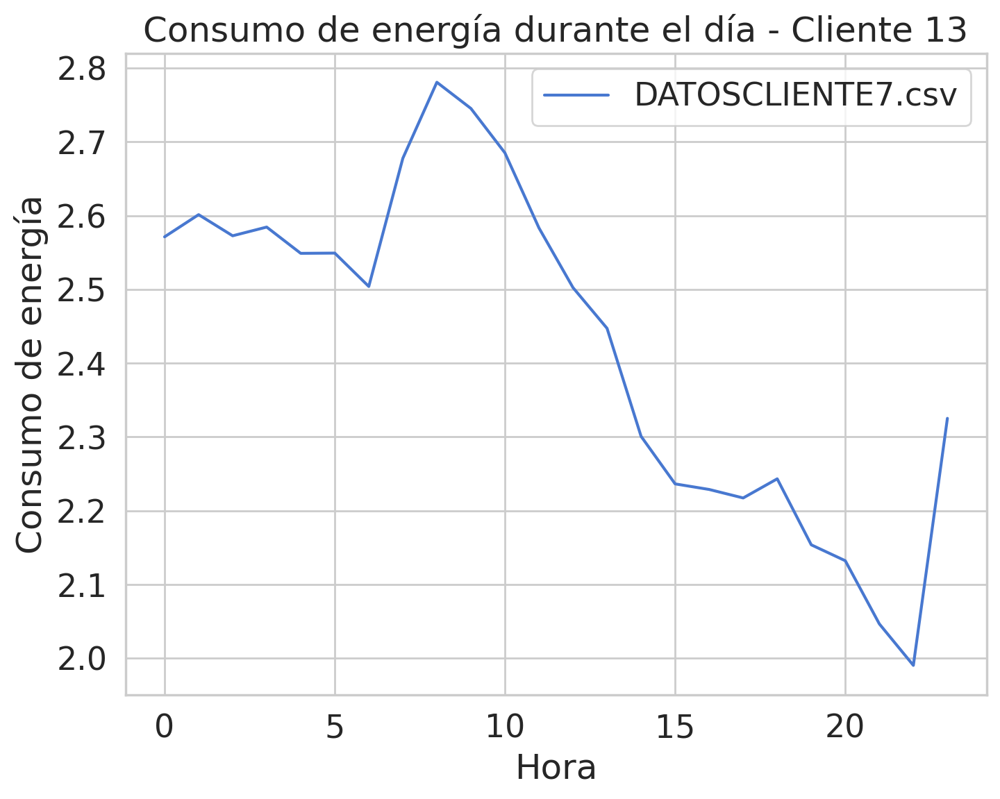

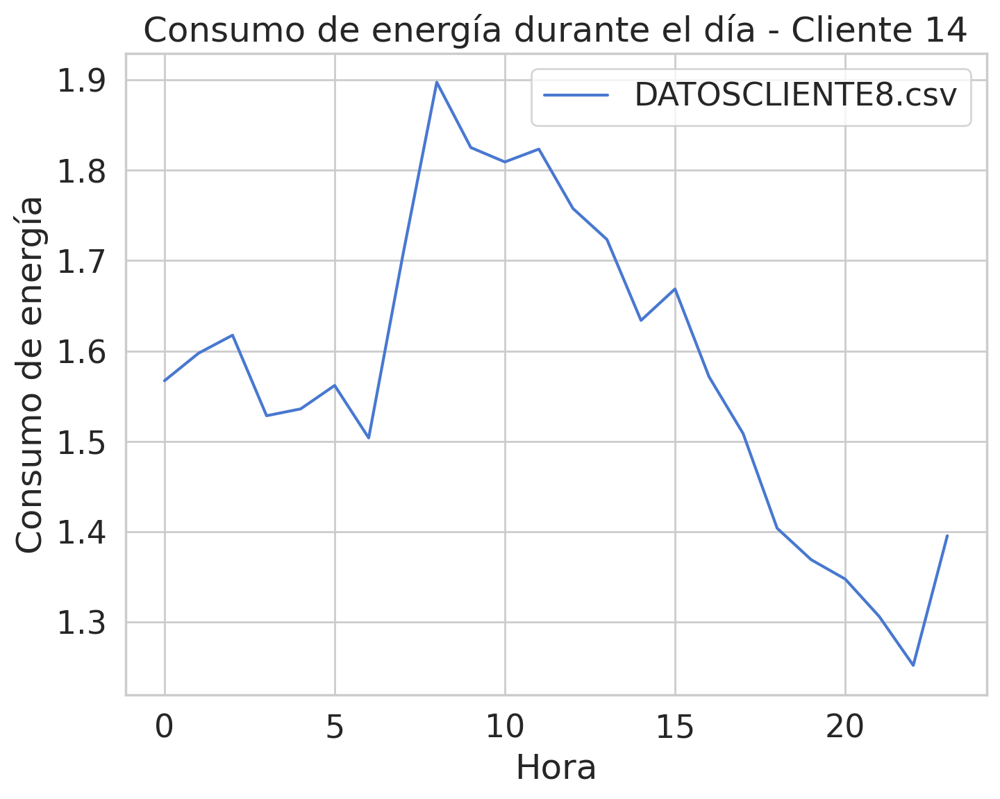

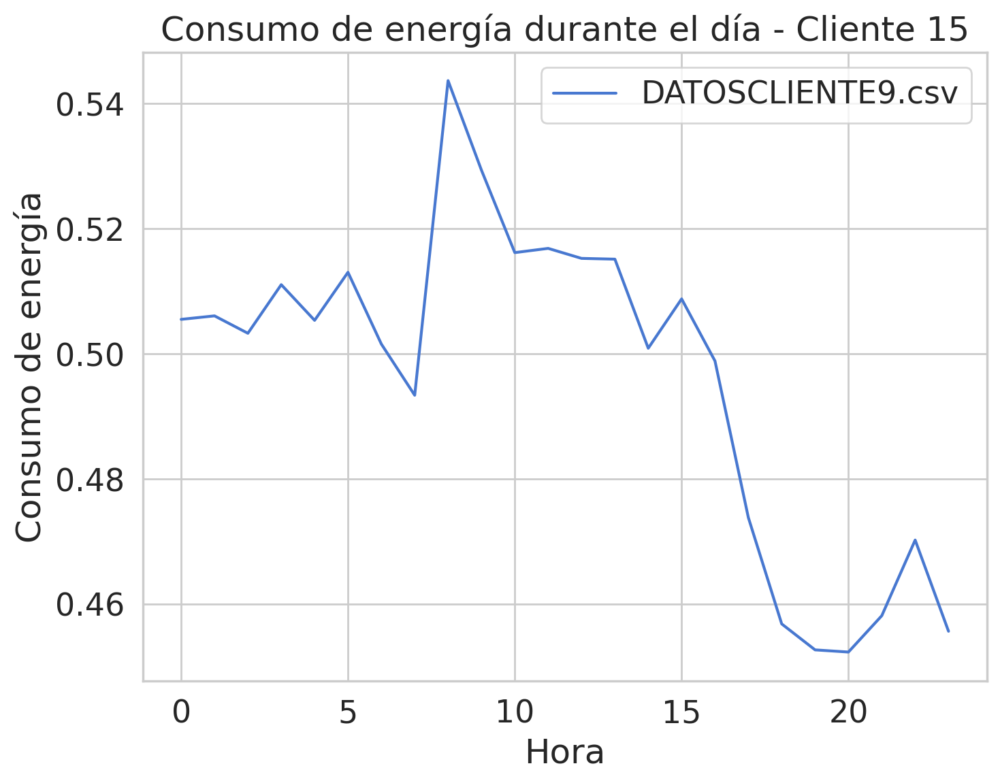

In [23]:
# Función para graficar el consumo de energía durante el día para cada cliente por separado
def plot_energy_consumption_day_time_for_each_client(mean_dfs_per_client):
    # Iterar sobre cada DataFrame de promedio por hora para cada cliente
    for i, df_per_client in enumerate(mean_dfs_per_client):
        plt.figure(figsize=(8, 6))
        
        # Convertir el tiempo a una representación numérica adecuada
        hours = range(len(df_per_client['Hora']))
        
        # Graficar el consumo de energía promedio en función del tiempo para el cliente actual
        plt.plot(hours, df_per_client['Average_Energia_activa'], label=df_per_client['Archivo'].iloc[0])
        
        plt.ylabel('Consumo de energía')
        plt.xlabel('Hora')
        plt.title(f'Consumo de energía durante el día - Cliente {i+1}')
        plt.legend()
        plt.show()

# Graficar el consumo de energía durante el día para cada cliente por separado
plot_energy_consumption_day_time_for_each_client(mean_dfs_per_client)


In [22]:
data_clean_filtered.head()

,Fecha,Voltaje_FA,Voltaje_FC,Archivo,Fecha_hora,Energia_activa,Energia_reactiva,Hora,Dia_semana
0,2021-01-01,455.139171,510.561002,DATOSCLIENTE1.csv,2021-01-01 00:00:00,0.357841,0.282788,00:00:00,Viernes
1,2021-01-01,469.978787,469.917178,DATOSCLIENTE1.csv,2021-01-01 01:00:00,0.372264,0.431377,01:00:00,Viernes
2,2021-01-01,468.721120,546.949147,DATOSCLIENTE1.csv,2021-01-01 02:00:00,1.044687,0.338626,02:00:00,Viernes
3,2021-01-01,452.329255,444.122989,DATOSCLIENTE1.csv,2021-01-01 03:00:00,0.566425,0.495791,03:00:00,Viernes
4,2021-01-01,513.477596,535.463719,DATOSCLIENTE1.csv,2021-01-01 04:00:00,1.080556,0.472018,04:00:00,Viernes


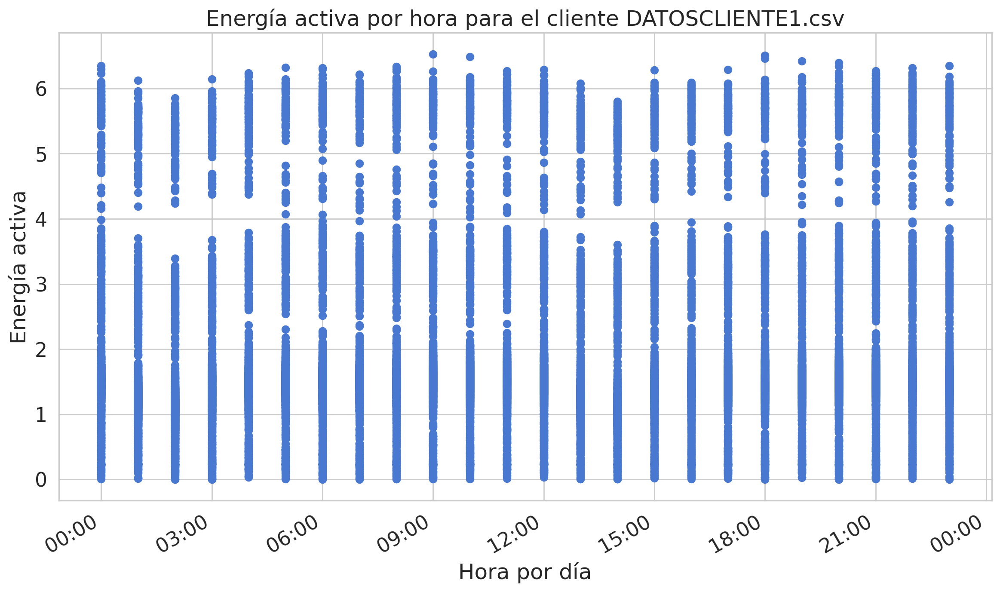

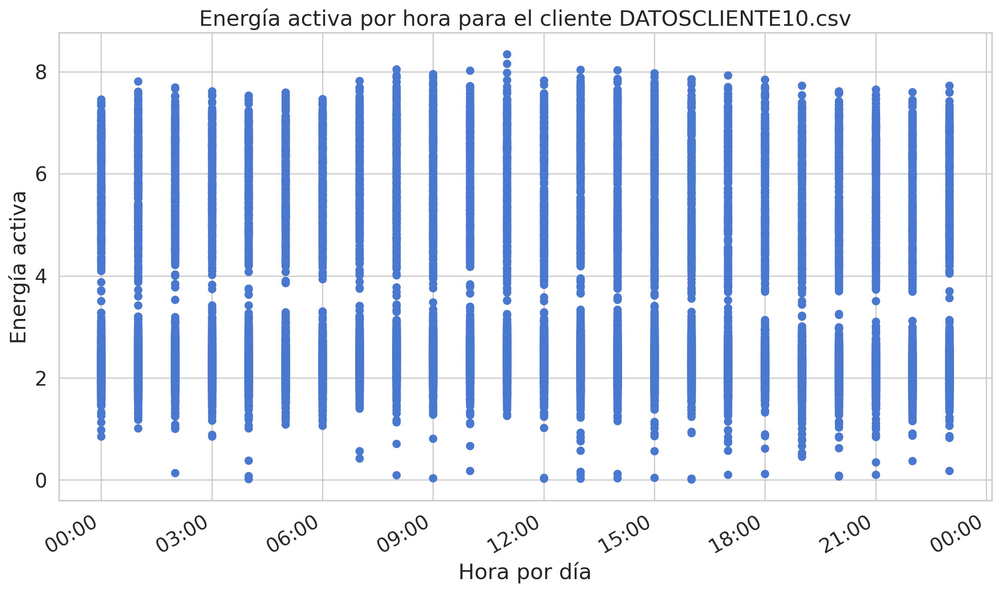

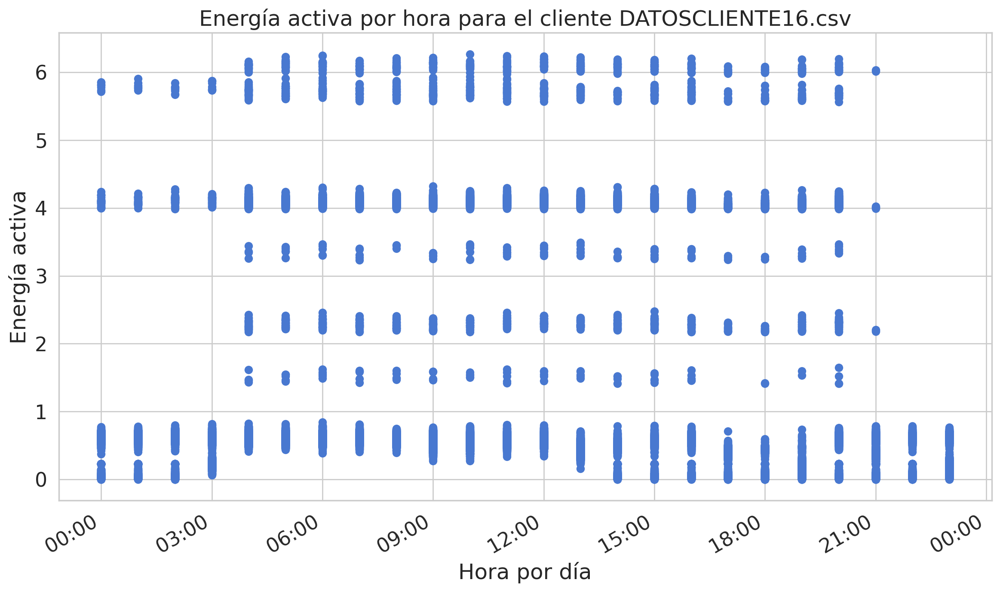

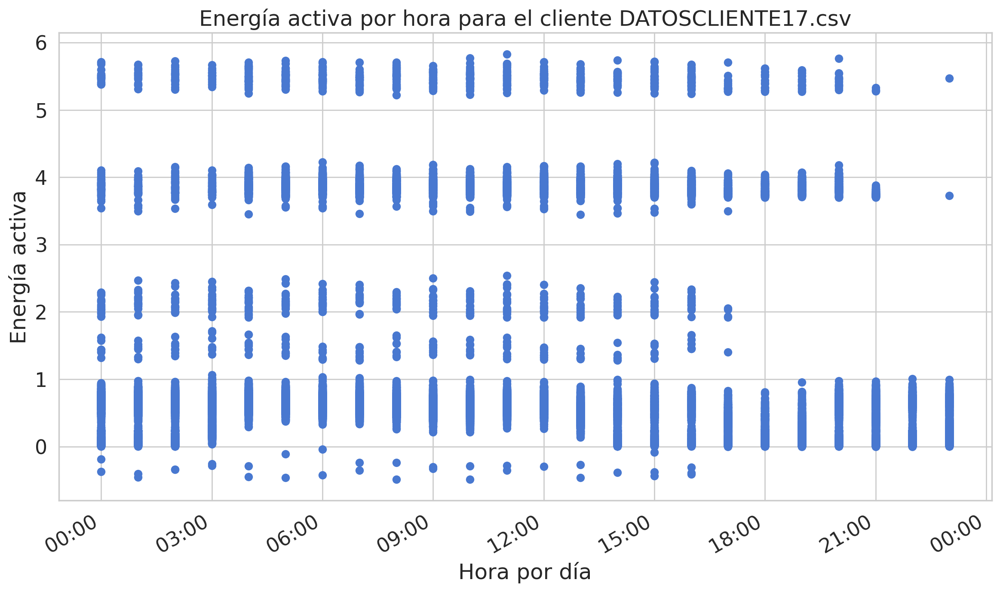

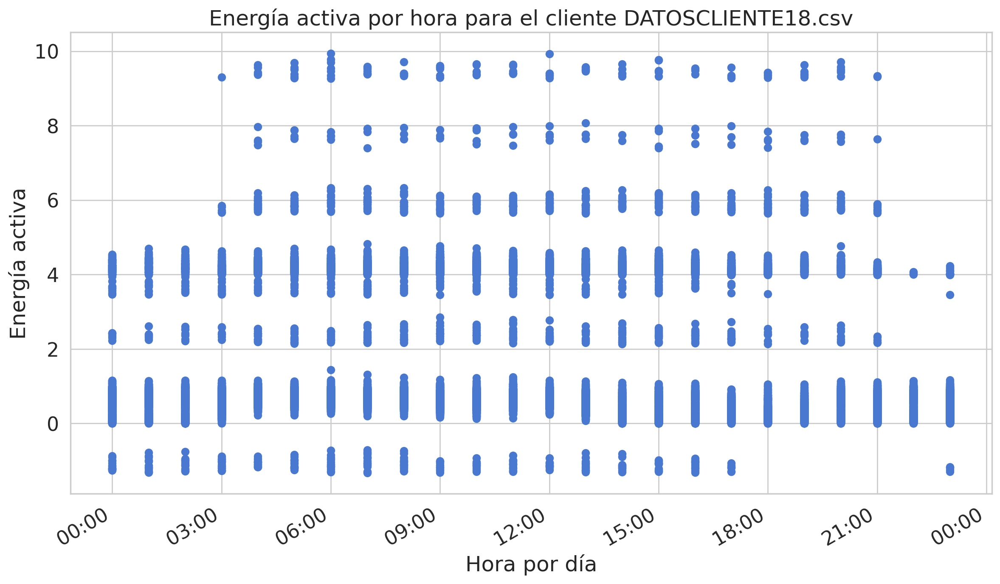

...

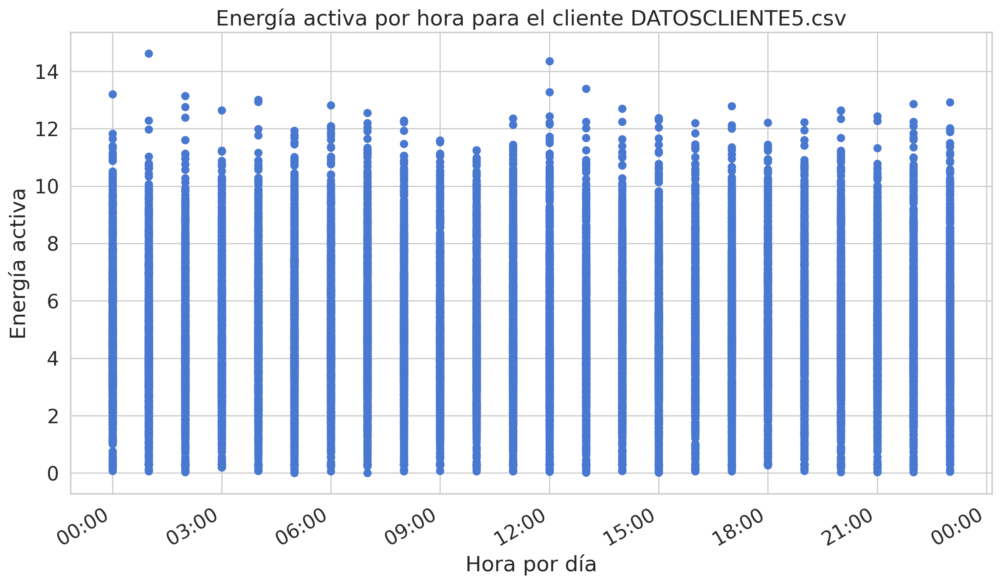

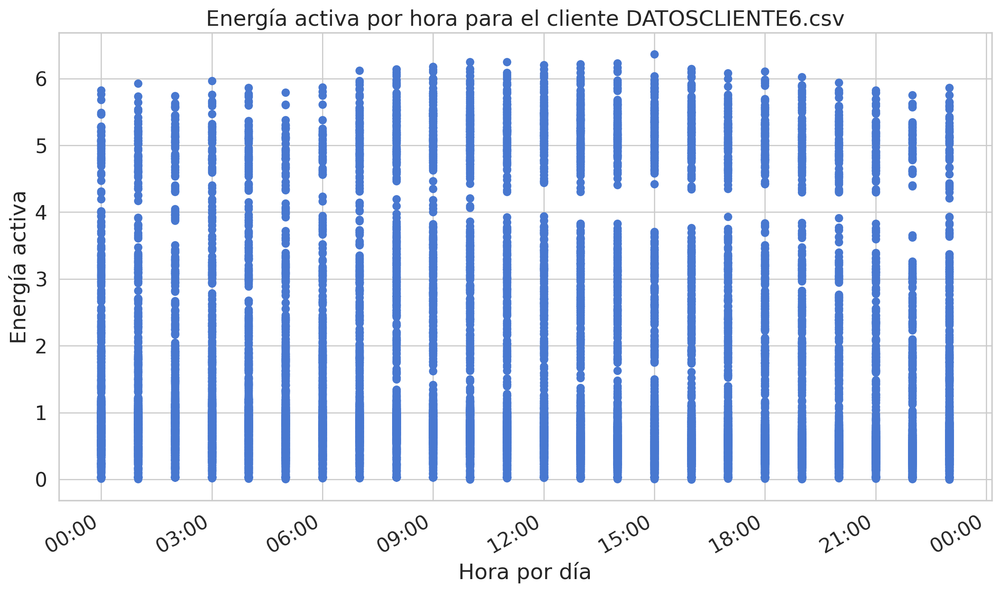

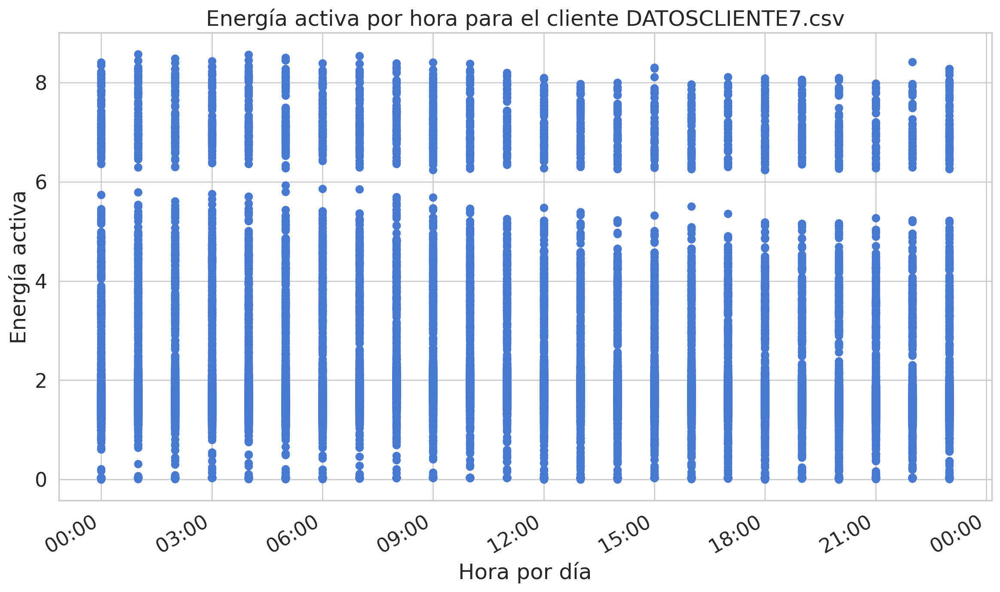

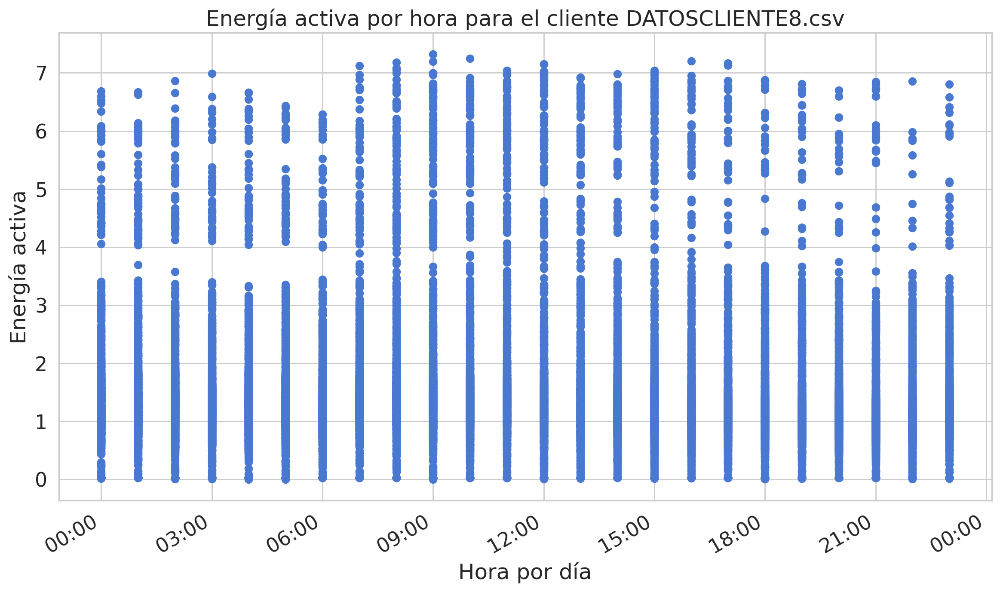

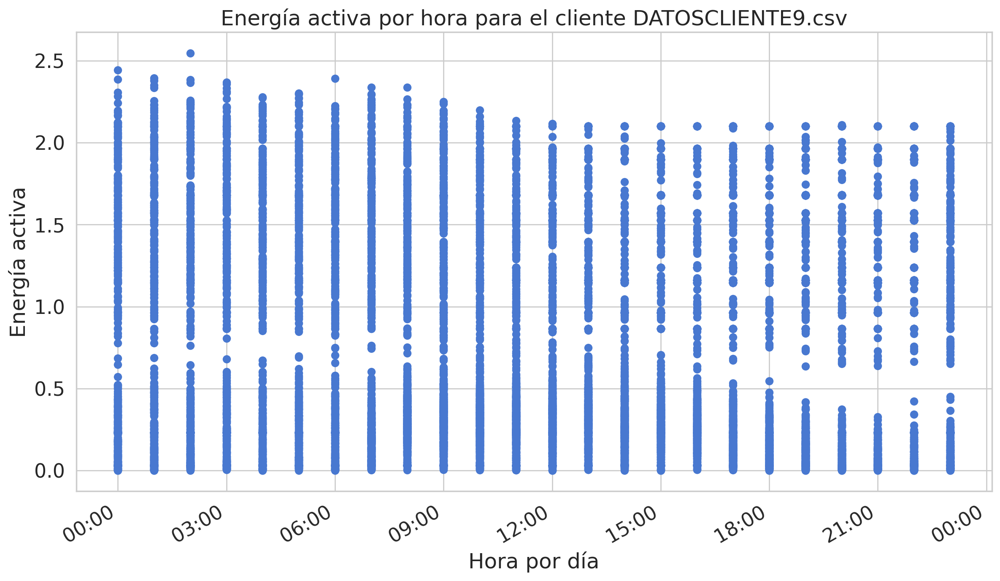

In [24]:
import matplotlib.dates as mdates
def plot_energy_consumption_day_time_for_each_client(data_clean_filtered):
    for client, filtered_df in data_clean_filtered.groupby('Archivo'):
        plt.figure(figsize=(14, 8))
        plt.plot([], [])
        rate = filtered_df['Energia_activa']
        time = pd.to_datetime(filtered_df['Hora'], format='%H:%M:%S')
        plt.scatter(time, rate)
        plt.gcf().autofmt_xdate()
        myFmt = mdates.DateFormatter('%H:%M')
        plt.gca().xaxis.set_major_formatter(myFmt)
        plt.xlabel("Hora por día")
        plt.ylabel('Energía activa')
        plt.title(f"Energía activa por hora para el cliente {client}")
        plt.show()

# Graficar el consumo de energía durante el día para cada cliente por separado
plot_energy_consumption_day_time_for_each_client(data_clean_filtered)


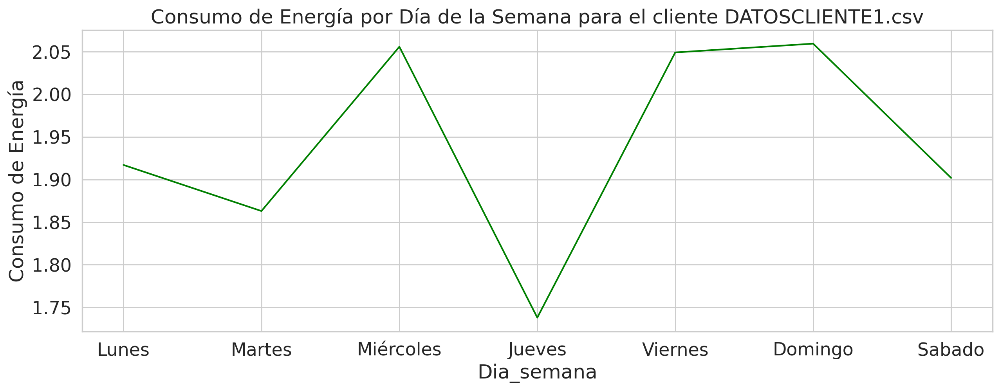

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.917166
Martes                     1.863053
Miércoles                  2.056026
Jueves                     1.737870
Viernes                    2.049300
Domingo                    2.059650
Sabado                     1.901967


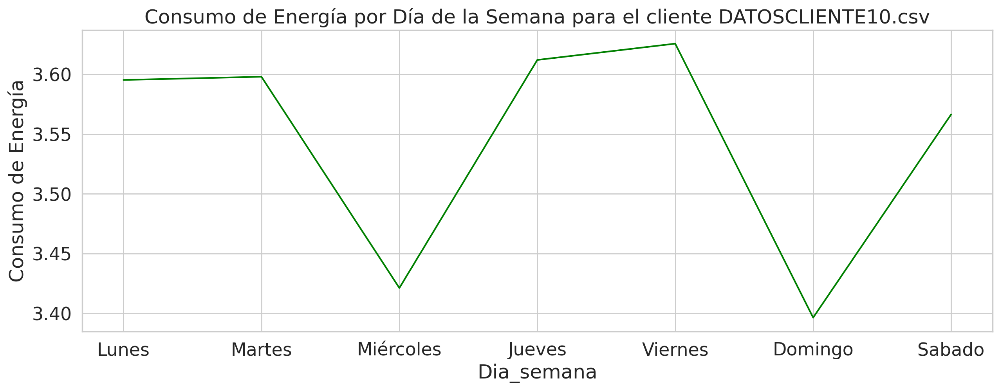

            Promedio_Energia_activa
Dia_semana                         
Lunes                      3.595221
Martes                     3.597926
Miércoles                  3.421361
Jueves                     3.611948
Viernes                    3.625573
Domingo                    3.396587
Sabado                     3.566392


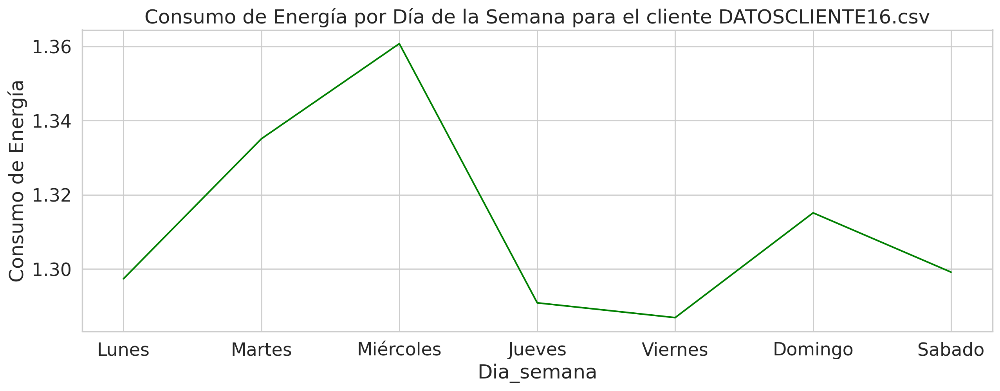

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.297381
Martes                     1.335131
Miércoles                  1.360788
Jueves                     1.290894
Viernes                    1.286910
Domingo                    1.315163
Sabado                     1.299176


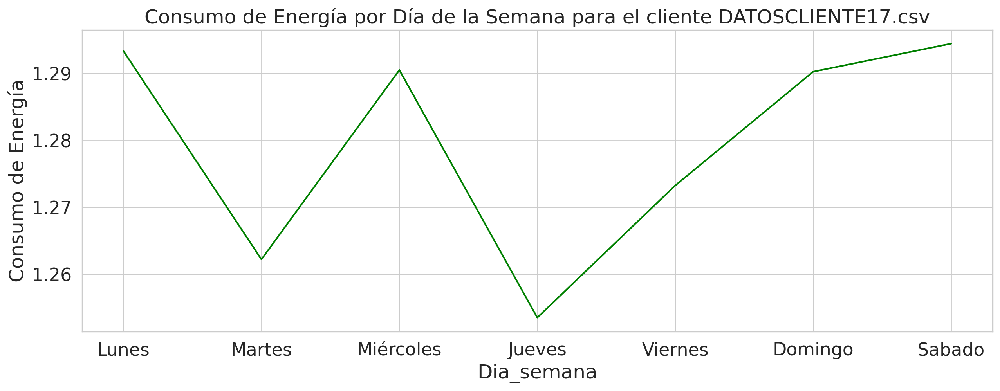

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.293322
Martes                     1.262223
Miércoles                  1.290503
Jueves                     1.253536
Viernes                    1.273258
Domingo                    1.290247
Sabado                     1.294440


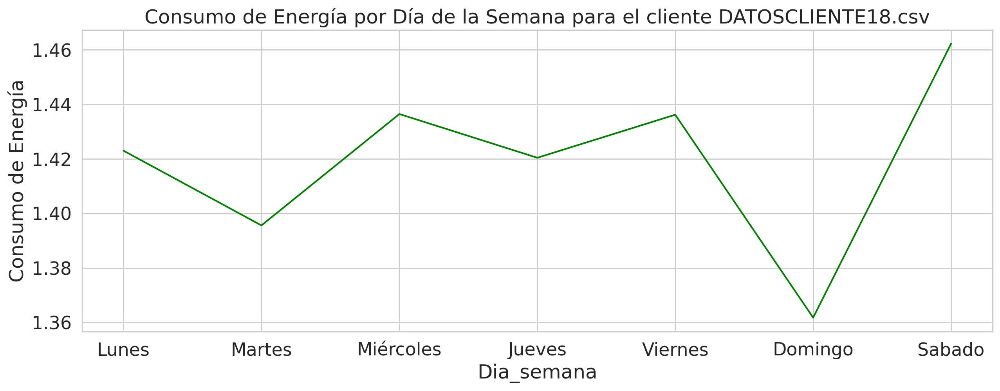

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.423018
Martes                     1.395609
Miércoles                  1.436471
Jueves                     1.420427
Viernes                    1.436220
Domingo                    1.361775
Sabado                     1.462296


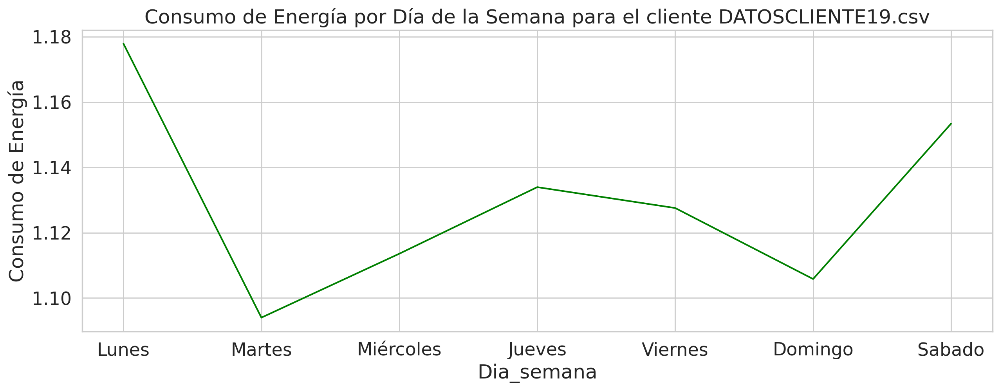

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.177899
Martes                     1.094002
Miércoles                  1.113575
Jueves                     1.133957
Viernes                    1.127566
Domingo                    1.105824
Sabado                     1.153380


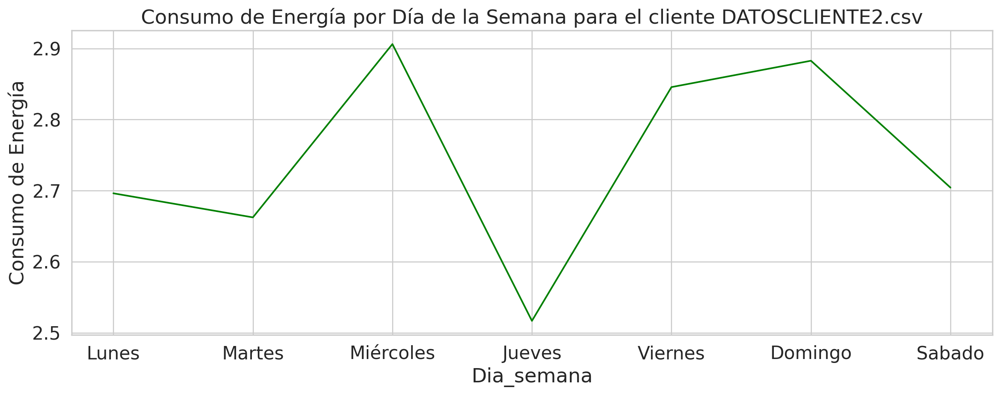

            Promedio_Energia_activa
Dia_semana                         
Lunes                      2.696352
Martes                     2.662503
Miércoles                  2.906198
Jueves                     2.516976
Viernes                    2.845695
Domingo                    2.882784
Sabado                     2.704356


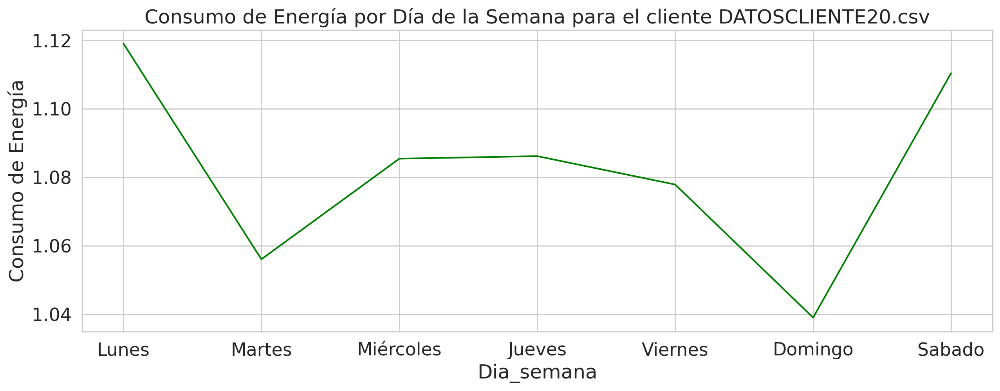

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.119031
Martes                     1.056065
Miércoles                  1.085439
Jueves                     1.086178
Viernes                    1.077886
Domingo                    1.039023
Sabado                     1.110388


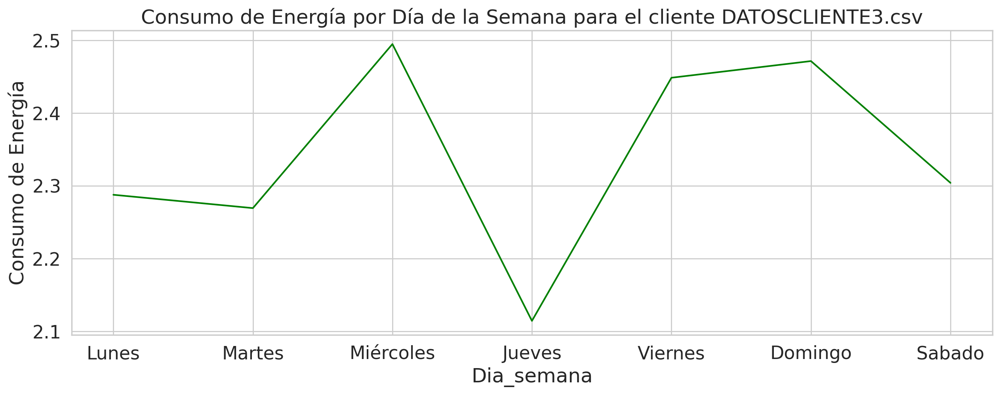

            Promedio_Energia_activa
Dia_semana                         
Lunes                      2.287788
Martes                     2.269448
Miércoles                  2.495028
Jueves                     2.114378
Viernes                    2.448752
Domingo                    2.471662
Sabado                     2.304180


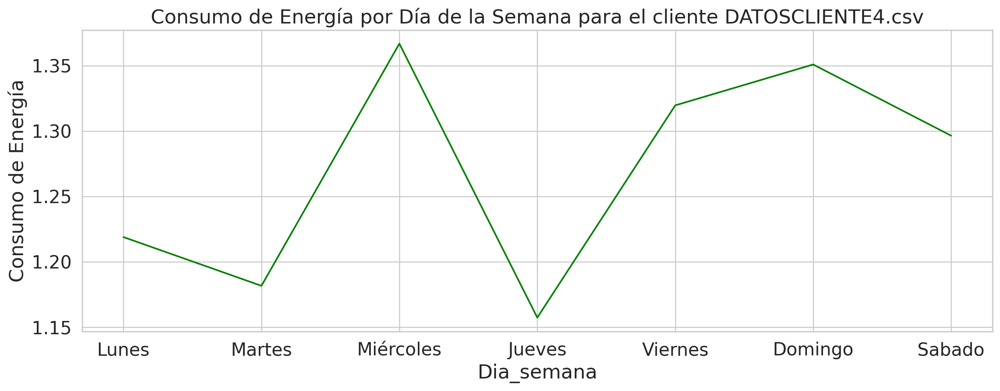

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.218850
Martes                     1.181576
Miércoles                  1.366894
Jueves                     1.157234
Viernes                    1.319654
Domingo                    1.350932
Sabado                     1.296475


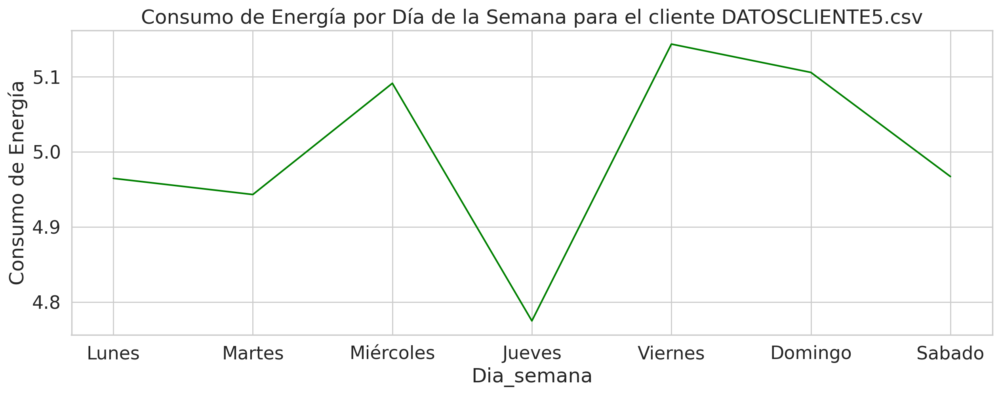

            Promedio_Energia_activa
Dia_semana                         
Lunes                      4.964721
Martes                     4.943187
Miércoles                  5.091372
Jueves                     4.774864
Viernes                    5.143598
Domingo                    5.105858
Sabado                     4.967151


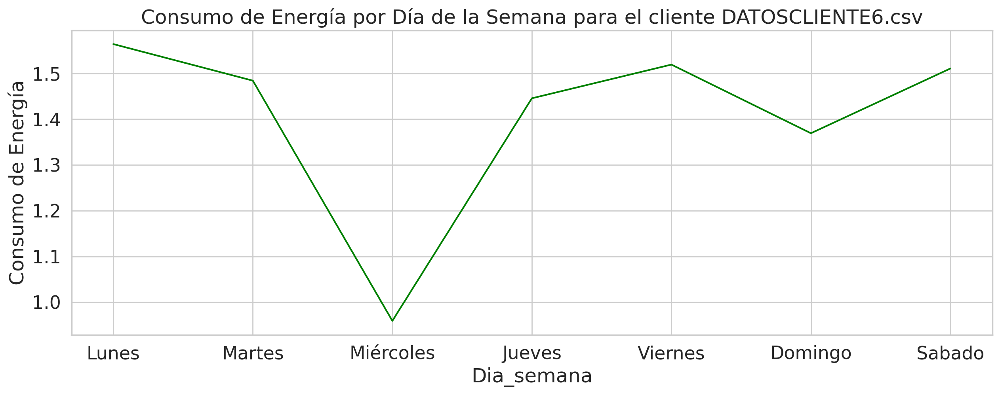

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.563983
Martes                     1.484096
Miércoles                  0.959235
Jueves                     1.445552
Viernes                    1.519177
Domingo                    1.369210
Sabado                     1.510669


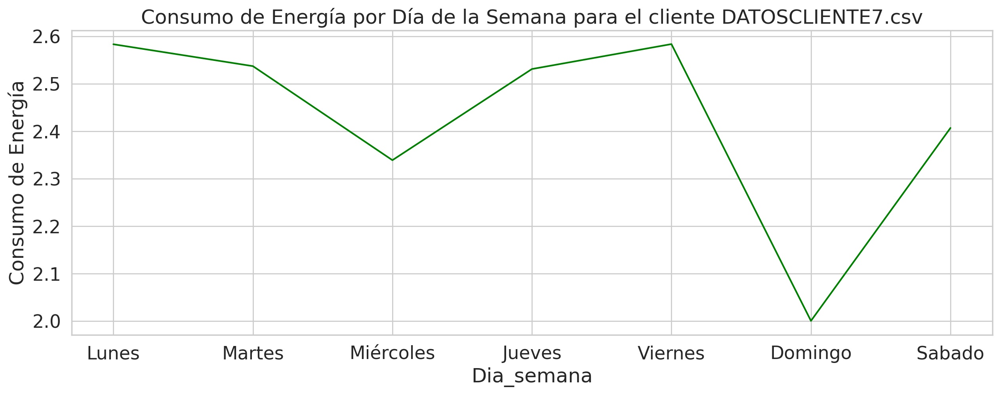

            Promedio_Energia_activa
Dia_semana                         
Lunes                      2.583266
Martes                     2.537189
Miércoles                  2.339098
Jueves                     2.531093
Viernes                    2.583630
Domingo                    2.000601
Sabado                     2.406974


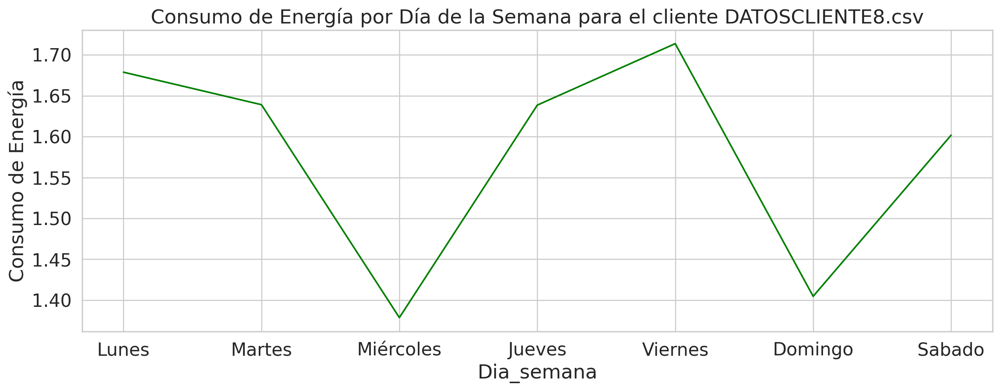

            Promedio_Energia_activa
Dia_semana                         
Lunes                      1.678859
Martes                     1.639112
Miércoles                  1.378654
Jueves                     1.638578
Viernes                    1.713788
Domingo                    1.404717
Sabado                     1.601773


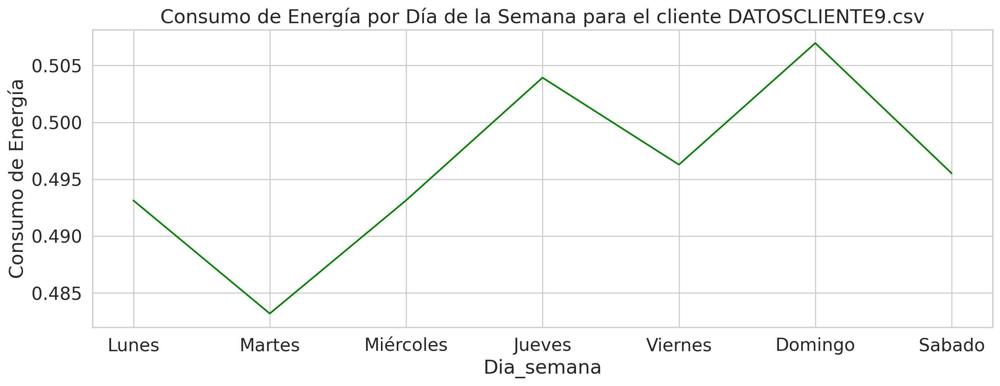

            Promedio_Energia_activa
Dia_semana                         
Lunes                      0.493140
Martes                     0.483199
Miércoles                  0.493156
Jueves                     0.503931
Viernes                    0.496286
Domingo                    0.506969
Sabado                     0.495521


In [25]:
def plot_energy_consumption_day_of_week_for_each_client(data_clean_filtered):
    for client, filtered_df in data_clean_filtered.groupby('Archivo'):
        plt.figure(figsize=(15, 5))
        dow_mean = filtered_df.groupby('Dia_semana')['Energia_activa'].mean().reset_index()
        dow_mean.columns = ['Dia_semana', 'Promedio_Energia_activa']
        day_order = {'Lunes': 0, 'Martes': 1, 'Miércoles': 2, 'Jueves': 3, 'Viernes': 4, 'Sábado': 5, 'Domingo': 6}
        dow_mean['Orden_dia'] = dow_mean['Dia_semana'].map(day_order)
        dow_mean_sorted = dow_mean.sort_values('Orden_dia')
        dow_mean_sorted = dow_mean_sorted.drop('Orden_dia', axis=1)
        dow_mean_sorted = dow_mean_sorted.reset_index(drop=True)
        dow_mean_sorted = dow_mean_sorted.set_index(['Dia_semana'])
        dow_mean_sorted['Promedio_Energia_activa'].plot(color='green')
        plt.ylabel('Consumo de Energía')
        plt.title(f'Consumo de Energía por Día de la Semana para el cliente {client}')
        plt.show()
        print(dow_mean_sorted)

# Generar los gráficos por cada cliente
plot_energy_consumption_day_of_week_for_each_client(data_clean_filtered)

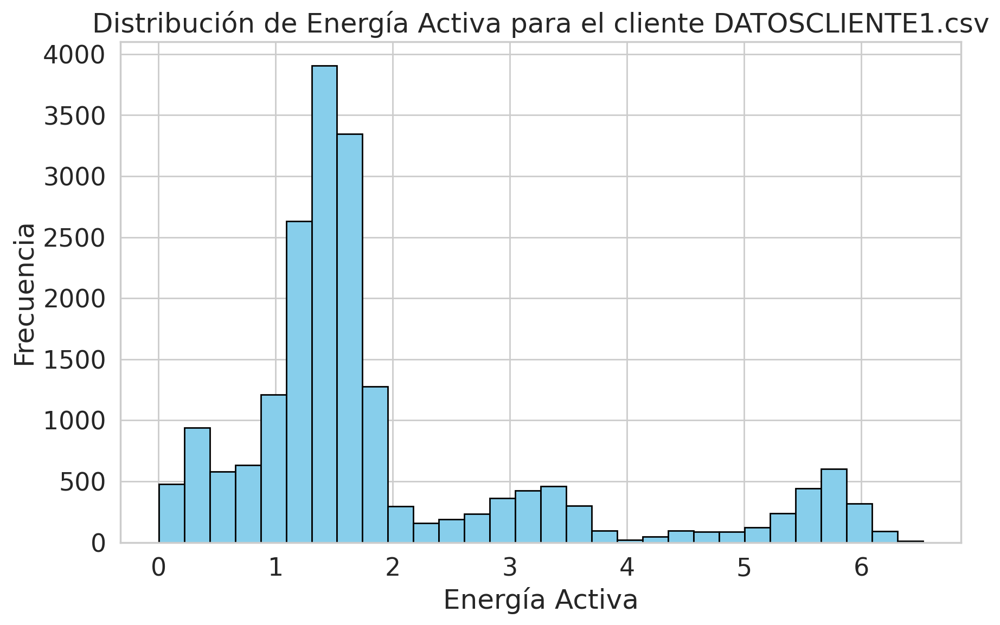

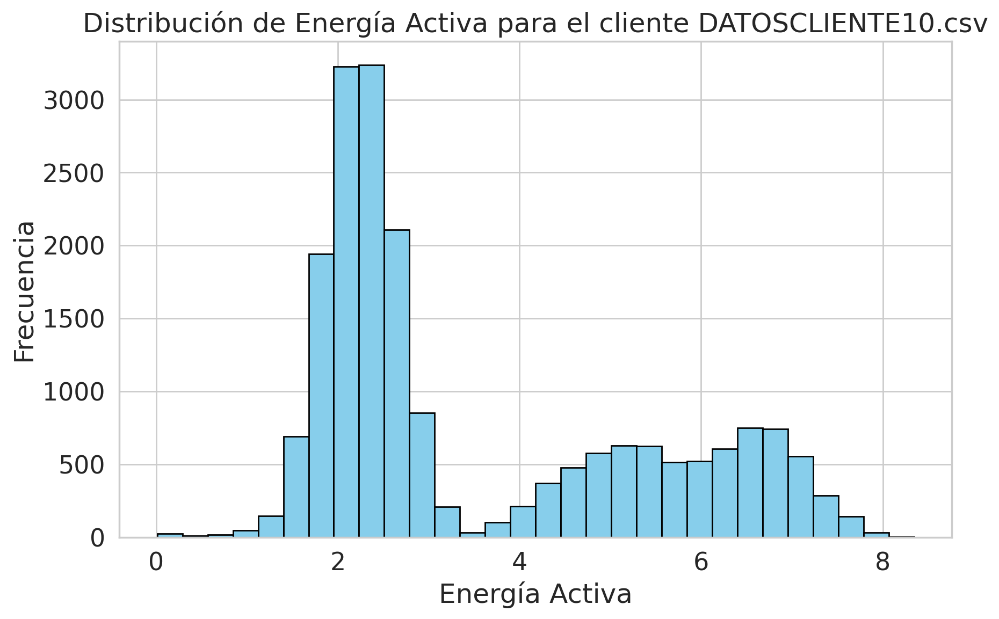

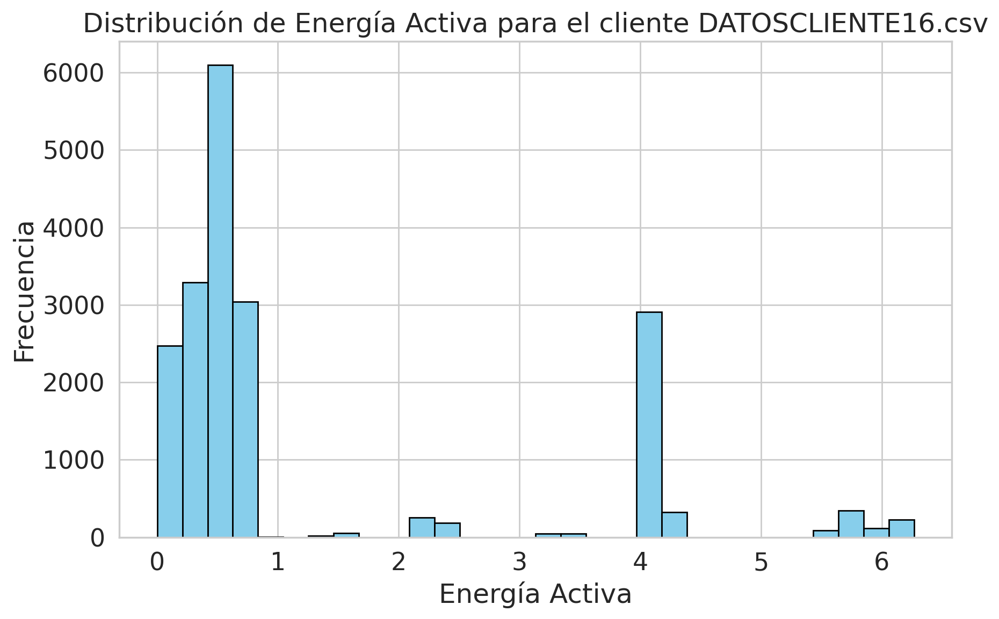

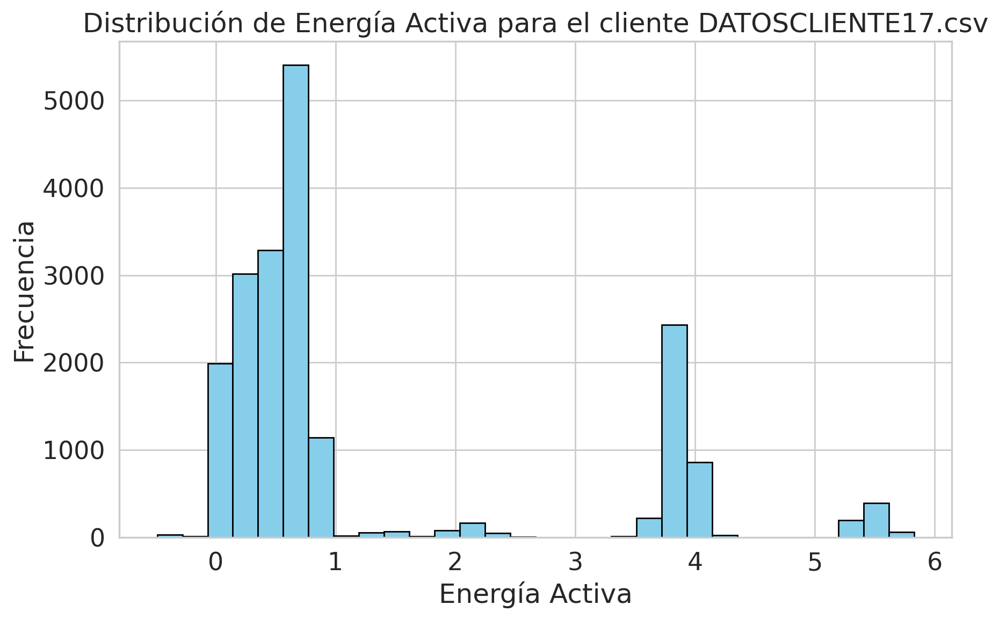

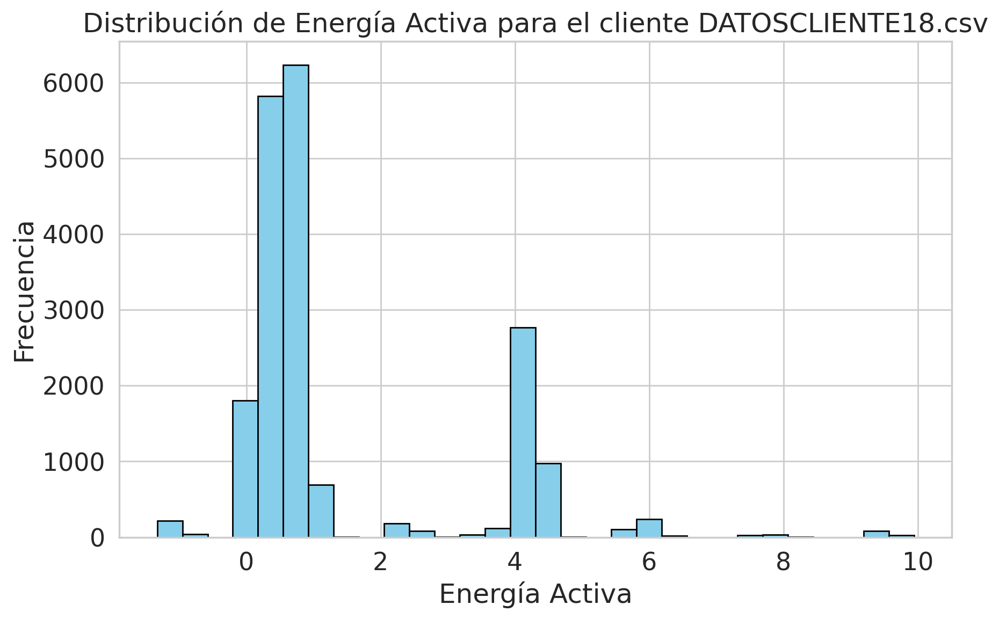

...

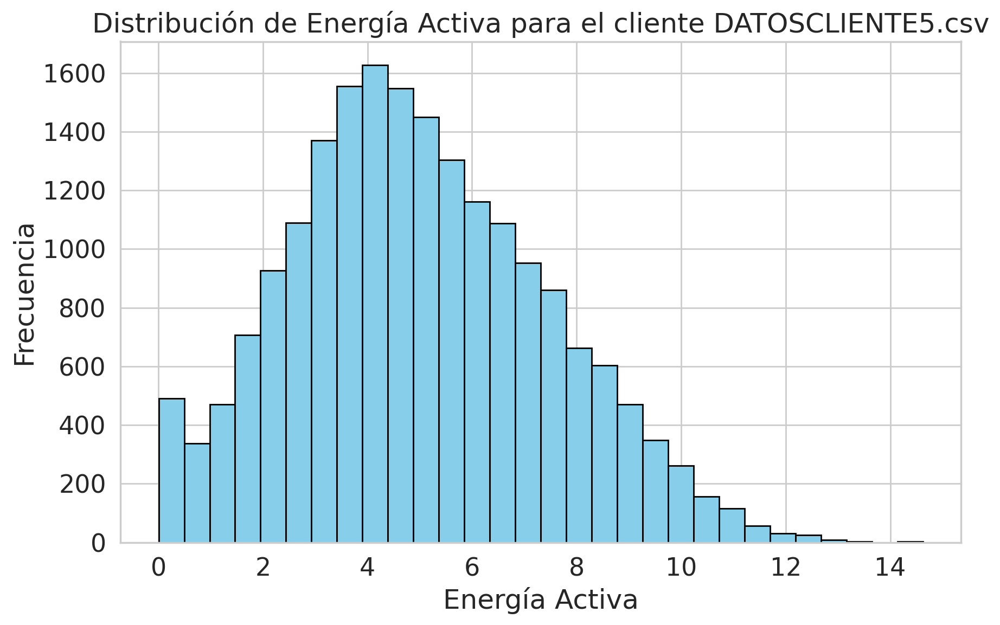

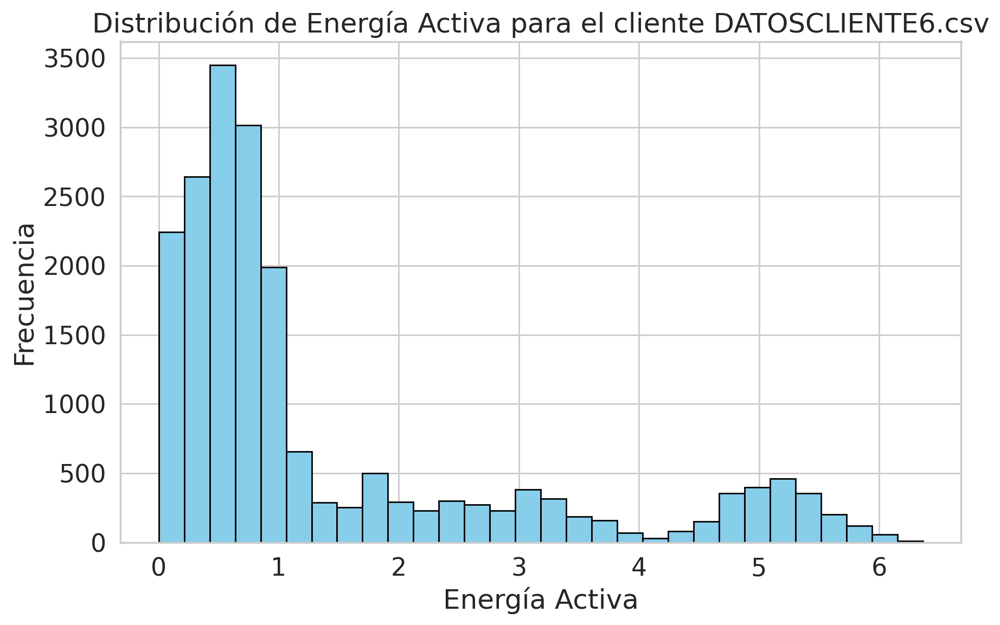

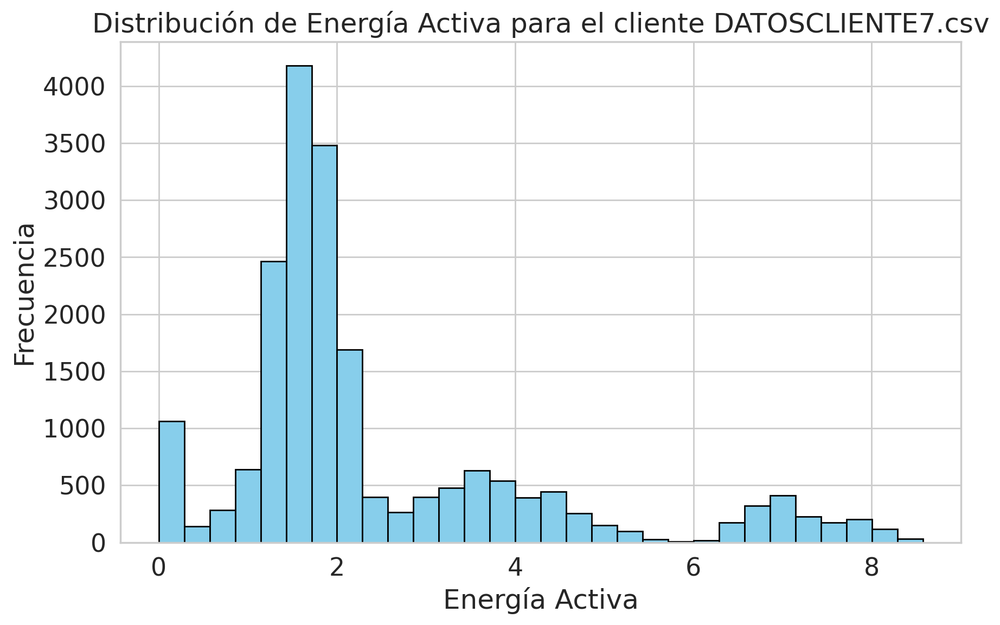

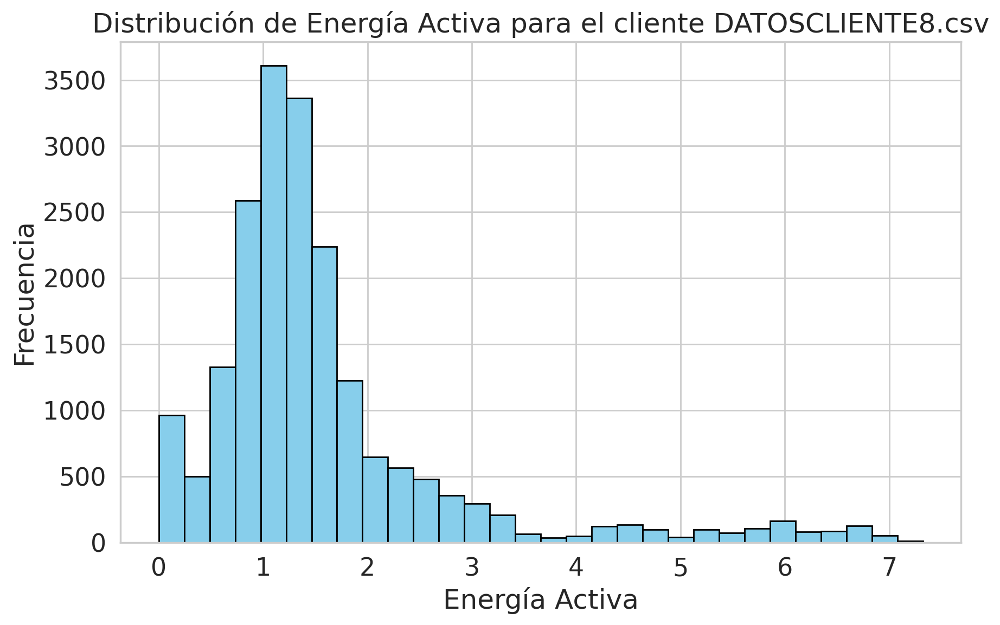

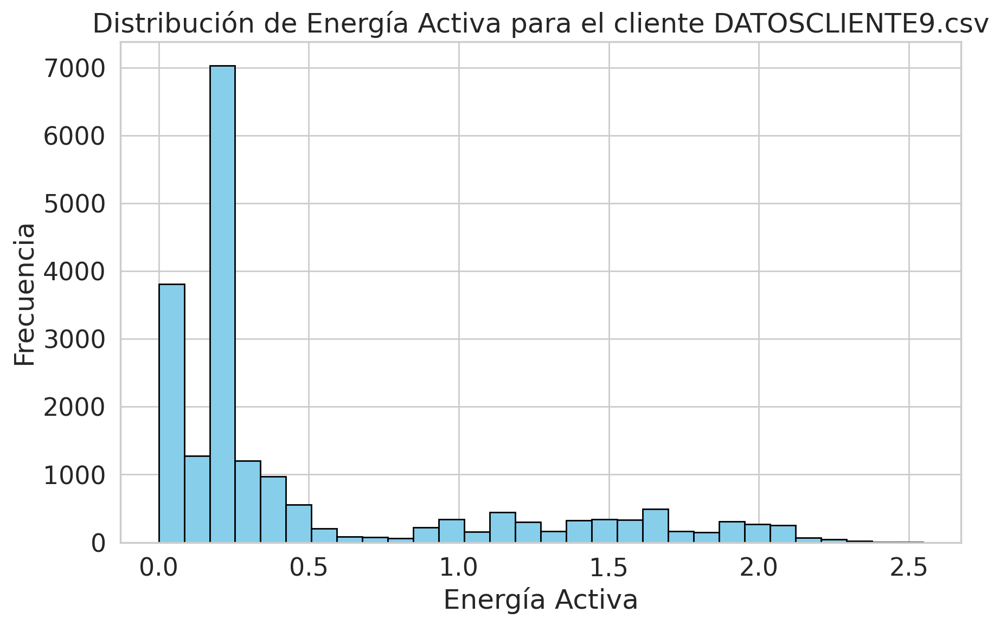

In [25]:
%%time
import matplotlib.pyplot as plt

def plot_energy_distribution_per_client(data_clean_filtered):
    for client, filtered_df in data_clean_filtered.groupby('Archivo'):
        plt.figure(figsize=(10, 6))
        plt.hist(filtered_df['Energia_activa'], bins=30, color='skyblue', edgecolor='black')
        plt.xlabel('Energía Activa')
        plt.ylabel('Frecuencia')
        plt.title(f'Distribución de Energía Activa para el cliente {client}')
        plt.grid(True)
        plt.show()

# Generar histograma por cada cliente
plot_energy_distribution_per_client(data_clean_filtered)

In [26]:
data_clean_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 294240 entries, 0 to 463423
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Fecha             294240 non-null  object        
 1   Voltaje_FA        294240 non-null  float64       
 2   Voltaje_FC        294240 non-null  float64       
 3   Archivo           294240 non-null  object        
 4   Fecha_hora        294240 non-null  datetime64[ns]
 5   Energia_activa    294240 non-null  float64       
 6   Energia_reactiva  294240 non-null  float64       
 7   Hora              294240 non-null  object        
 8   Dia_semana        294240 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 30.5+ MB


In [27]:
# Lista para almacenar los DataFrames individuales de cada cliente
dfs_por_cliente = []

# Iterar sobre cada cliente
for cliente, df_cliente in data_clean_filtered.groupby('Archivo'):
    # Crear un DataFrame para el cliente actual con las columnas 'Fecha_hora' y 'Energia_activa'
    df_cliente_individual = df_cliente[['Fecha_hora', 'Energia_activa']]
    # Establecer 'Fecha_hora' como el índice del DataFrame
    df_cliente_individual = df_cliente_individual.set_index('Fecha_hora')
    # Agregar el DataFrame del cliente actual a la lista
    dfs_por_cliente.append((cliente, df_cliente_individual))

# Imprimir los primeros registros de cada DataFrame
for cliente, df_cliente in dfs_por_cliente:
    print(f"DataFrame para el cliente: {cliente}")
    print(df_cliente.head())
    print()

DataFrame para el cliente: DATOSCLIENTE1.csv
                     Energia_activa
Fecha_hora                         
2021-01-01 00:00:00        0.357841
2021-01-01 01:00:00        0.372264
2021-01-01 02:00:00        1.044687
2021-01-01 03:00:00        0.566425
2021-01-01 04:00:00        1.080556

DataFrame para el cliente: DATOSCLIENTE10.csv
                     Energia_activa
Fecha_hora                         
2021-01-01 00:00:00        2.873046
2021-01-01 01:00:00        2.037791
2021-01-01 02:00:00        2.358945
2021-01-01 03:00:00        1.347161
2021-01-01 04:00:00        2.486699

DataFrame para el cliente: DATOSCLIENTE16.csv
                     Energia_activa
Fecha_hora                         
2021-01-01 00:00:00        0.020158
2021-01-01 01:00:00        0.231000
2021-01-01 02:00:00        0.014679
2021-01-01 03:00:00        0.191819
2021-01-01 04:00:00        0.660391

DataFrame para el cliente: DATOSCLIENTE17.csv
                     Energia_activa
Fecha_hora            

In [28]:
##grupo1: 1,2,3,4,5; Grupo2: 6,7,8,10; Grupo3: 9,16,17,18,19,20 
df_cliente1_idx = dfs_por_cliente[0]
df_cliente6_idx = dfs_por_cliente[11]
df_cliente17_idx = dfs_por_cliente[3]

df_cliente1_idx = df_cliente1_idx[1]
df_cliente6_idx = df_cliente6_idx[1]
df_cliente17_idx = df_cliente17_idx[1]

df_cliente1 = df_cliente1_idx.reset_index()
df_cliente6 = df_cliente6_idx.reset_index()
df_cliente17 = df_cliente17_idx.reset_index()

In [29]:
df_cliente6_idx.head()

,Energia_activa
Fecha_hora,
2021-01-01 00:00:00,0.718624
2021-01-01 01:00:00,0.448971
2021-01-01 02:00:00,0.446228
2021-01-01 03:00:00,0.140145
2021-01-01 04:00:00,0.666506


In [30]:
# Check for NaN values in the original DataFrames
print("NaNs in original data:")
print("df_cliente1:", df_cliente1_idx.isna().any())
print("df_cliente6:", df_cliente6_idx.isna().any())
print("df_cliente17:", df_cliente17_idx.isna().any())

NaNs in original data:
df_cliente1: Energia_activa    False
dtype: bool
df_cliente6: Energia_activa    False
dtype: bool
df_cliente17: Energia_activa    False
dtype: bool


In [31]:
# Scaling for df_cliente1
scaler1 = MinMaxScaler()
scaler_data1 = scaler1.fit_transform(df_cliente1_idx)
# Check for NaNs after scaling
print("NaNs after scaling for df_cliente1:", np.isnan(scaler_data1).any())

NaNs after scaling for df_cliente1: False


In [32]:
# Scaling for df_cliente6
scaler6 = MinMaxScaler()
scaler_data6 = scaler6.fit_transform(df_cliente6_idx)
# Check for NaNs after scaling
print("NaNs after scaling for df_cliente6:", np.isnan(scaler_data6).any())

NaNs after scaling for df_cliente6: False


In [33]:
# Scaling for df_cliente17
scaler17 = MinMaxScaler()
scaler_data17 = scaler17.fit_transform(df_cliente17_idx)
# Check for NaNs after scaling
print("NaNs after scaling for df_cliente17:", np.isnan(scaler_data17).any())

NaNs after scaling for df_cliente17: False


In [34]:
# Create DataFrames
index1 = np.arange(0, len(scaler_data1), 1)
scaler_df1 = pd.DataFrame(scaler_data1, index=index1, columns=['Energia_activa'])

index6 = np.arange(0, len(scaler_data6), 1)
scaler_df6 = pd.DataFrame(scaler_data6, index=index6, columns=['Energia_activa'])

index17 = np.arange(0, len(scaler_data17), 1)
scaler_df17 = pd.DataFrame(scaler_data17, index=index17, columns=['Energia_activa'])

In [35]:
# Splitting the data for df_cliente1
train_size1 = int(len(scaler_df1) * 0.8)
train1, test1 = scaler_df1.iloc[0:train_size1], scaler_df1.iloc[train_size1:len(scaler_df1)]
print("Train size for df_cliente1:", len(train1), "Test size for df_cliente1:", len(test1))

# Splitting the data for df_cliente6
train_size6 = int(len(scaler_df6) * 0.8)
train6, test6 = scaler_df6.iloc[0:train_size6], scaler_df6.iloc[train_size6:len(scaler_df6)]
print("Train size for df_cliente6:", len(train6), "Test size for df_cliente6:", len(test6))

# Splitting the data for df_cliente17
train_size17 = int(len(scaler_df17) * 0.8)
train17, test17 = scaler_df17.iloc[0:train_size17], scaler_df17.iloc[train_size17:len(scaler_df17)]
print("Train size for df_cliente17:", len(train17), "Test size for df_cliente17:", len(test17))

Train size for df_cliente1: 15744 Test size for df_cliente1: 3936
Train size for df_cliente6: 15744 Test size for df_cliente6: 3936
Train size for df_cliente17: 15590 Test size for df_cliente17: 3898


In [36]:
train17

,Energia_activa
0,0.113882
1,0.089321
2,0.094401
3,0.119605
4,0.164251
...,...
15585,0.138680
15586,0.182605
15587,0.172474
15588,0.184385


In [37]:
test17

,Energia_activa
15590,0.100365
15591,0.081417
15592,0.113882
15593,0.084346
15594,0.113882
...,...
19483,0.081440
19484,0.176271
19485,0.200181
19486,0.195634


In [38]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)        
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

# Define the time steps
n_steps = 24

# Prepare training data
X_train1, y_train1 = create_dataset(train1, train1['Energia_activa'], n_steps)
X_train6, y_train6 = create_dataset(train6, train6['Energia_activa'], n_steps)
X_train17, y_train17 = create_dataset(train17, train17['Energia_activa'], n_steps)

# Prepare test data
X_test1, y_test1 = create_dataset(test1, test1['Energia_activa'], n_steps)
X_test6, y_test6 = create_dataset(test6, test6['Energia_activa'], n_steps)
X_test17, y_test17 = create_dataset(test17, test17['Energia_activa'], n_steps)

print("Training data shape:", X_train1.shape, y_train1.shape)
print("Test data shape:", X_test1.shape, y_test1.shape)
print(" ")
print("Training data shape:", X_train6.shape, y_train6.shape)
print("Test data shape:", X_test6.shape, y_test6.shape)
print(" ")
print("Training data shape:", X_train17.shape, y_train17.shape)
print("Test data shape:", X_test17.shape, y_test17.shape)

Training data shape: (15720, 24, 1) (15720,)
Test data shape: (3912, 24, 1) (3912,)
 
Training data shape: (15720, 24, 1) (15720,)
Test data shape: (3912, 24, 1) (3912,)
 
Training data shape: (15566, 24, 1) (15566,)
Test data shape: (3874, 24, 1) (3874,)


In [39]:
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import Adam

## Cliente 1

In [40]:
# Model Architecture
lstm_model1 = keras.Sequential([
    LSTM(units=128,activation="tanh", input_shape=(X_train1.shape[1], X_train1.shape[2]), return_sequences=True),  # return_sequences=True if adding more LSTM layers
    Dropout(0.2),  # Optional: Dropout for regularization
    LSTM(units=64, activation="relu"),  # Additional LSTM Layer
    Dropout(0.2),  # Optional: Another dropout layer for regularization
    Dense(units=1)
])
# Compile the model
lstm_model1.compile(
    loss='mean_squared_error',
    optimizer=keras.optimizers.Adam(0.001)
)
# Callbacks
early_stopping1 = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint1 = ModelCheckpoint('best_lstm_model1.keras', monitor='val_loss', save_best_only=True)

# Model Training
history = lstm_model1.fit(
    X_train1, y_train1,
    epochs=200,
    batch_size=24,
    validation_split=0.1,
    verbose=1
)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.0119 - val_loss: 0.0021
Epoch 2/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0039 - val_loss: 0.0022
Epoch 3/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0036 - val_loss: 0.0018
Epoch 4/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0032 - val_loss: 0.0018
Epoch 5/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.0031 - val_loss: 0.0018
Epoch 6/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0029 - val_loss: 0.0018
Epoch 7/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.0028 - val_loss: 0.0016
Epoch 8/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0027 - val_loss: 0.0016
Epoch 9/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0027 - val_loss: 0.0015
Epoch 10/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0027 - val_loss: 0.0015
Epoch 11/200
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0027 - val_loss: 0.0015
Epoch 12/200
590/59

In [41]:
from sklearn.metrics import r2_score
predictions = lstm_model1.predict(X_test1)
score = r2_score(y_test1,predictions)
print("R-Squared Score of LSTM model",score)

123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step
R-Squared Score of LSTM model 0.7225379019272232


In [42]:
lstm_pred1 = lstm_model1.predict(X_test1)
df_lstm_final1 = test1[lstm_pred1.shape[0]*-1:].copy()
df_lstm_final1['Prediction'] = lstm_pred1[:,0]
df_reset_index1 = df_cliente1.reset_index()
df_lstm_final1['Fecha_hora'] = df_reset_index1['Fecha_hora']
df_lstm_final1 = df_lstm_final1.set_index(["Fecha_hora"], drop=True)

123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


In [43]:
df_lstm_final1['Energia_activa'] = scaler1.inverse_transform(df_lstm_final1['Energia_activa'].to_numpy().reshape(-1, 1))
df_lstm_final1['Prediction'] = scaler1.inverse_transform(df_lstm_final1['Prediction'].to_numpy().reshape(-1, 1))

In [44]:
df_lstm_final1

,Energia_activa,Prediction
Fecha_hora,,
2022-10-20 00:00:00,1.668859,1.497063
2022-10-20 01:00:00,1.426148,1.293936
2022-10-20 02:00:00,0.969420,1.102709
2022-10-20 03:00:00,1.684012,1.152224
2022-10-20 04:00:00,1.325986,1.428385
...,...,...
2023-03-31 19:00:00,1.176257,1.342309
2023-03-31 20:00:00,1.511845,1.345426
2023-03-31 21:00:00,1.395845,1.310968


In [45]:
train1_2 = train1.copy()
train1_2.index = df_cliente1.index[:len(train1)]
train1_2['Energia_activa'] = scaler1.inverse_transform(train1_2['Energia_activa'].to_numpy().reshape(-1, 1))
train1_2['Fecha_hora'] = df_cliente1['Fecha_hora']
train1_2 = train1_2.set_index(['Fecha_hora'])

In [46]:
def report_metrics(y_true, y_pred):
    explained_variance = metrics.explained_variance_score(y_true, y_pred)
    mae = metrics.mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(metrics.mean_squared_error(y_true, y_pred))
    mse = metrics.mean_squared_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    print("Explained Variance:", explained_variance)
    print("MAE:", mae)
    print("RMSE:", rmse)
    print("MSE:", mse)
    print("MAPE:", mape)

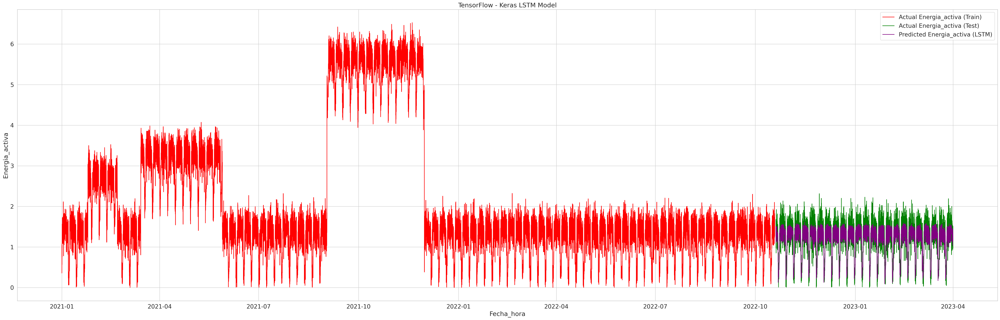

Explained Variance: 0.7270870857124799
MAE: 0.1901465358559634
RMSE: 0.24092179682717868
MSE: 0.058043312186436366
MAPE: 31.308833853066787


In [47]:
plt.figure(figsize=(50,15))
plt.title('TensorFlow - Keras LSTM Model')
plt.plot(train1_2, color='red', label='Actual Energia_activa (Train)')
plt.xlabel('Fecha_hora')
plt.ylabel('Energia_activa')
plt.plot(df_lstm_final1['Energia_activa'], color='green', label='Actual Energia_activa (Test)')
plt.plot(df_lstm_final1['Prediction'], color='purple', label='Predicted Energia_activa (LSTM)')
plt.legend()

plt.show()

report_metrics(df_lstm_final1['Energia_activa'].squeeze(), df_lstm_final1['Prediction'].squeeze())

In [48]:
from keras.models import load_model
# Guardar el modelo
lstm_model1.save('lstm_model1.h5')

## Cliente 6

In [49]:
# Model Architecture
lstm_model6 = keras.Sequential([
    LSTM(units=128,activation="tanh", input_shape=(X_train6.shape[1], X_train6.shape[2]), return_sequences=True),  # return_sequences=True if adding more LSTM layers
    Dropout(0.2),  # Optional: Dropout for regularization
    LSTM(units=64, activation="relu"),  # Additional LSTM Layer
    Dropout(0.2),  # Optional: Another dropout layer for regularization
    Dense(units=1)
])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [50]:
# Compile the model
lstm_model6.compile(
    loss='mean_squared_error',
    optimizer=keras.optimizers.Adam(0.001)
)

In [51]:
# Callbacks
early_stopping6 = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint6 = ModelCheckpoint('best_lstm_model1.keras', monitor='val_loss', save_best_only=True)

In [52]:
# Model Training
history = lstm_model6.fit(
    X_train6, y_train6,
    epochs=500,
    batch_size=24,
    validation_split=0.1,
    verbose=1,
    shuffle=False,
    callbacks=[early_stopping6, model_checkpoint6]
)

Epoch 1/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.0219 - val_loss: 0.0010
Epoch 2/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.0194 - val_loss: 0.0010
Epoch 3/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.0188 - val_loss: 0.0011
Epoch 4/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.0184 - val_loss: 0.0010
Epoch 5/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.0185 - val_loss: 0.0010
Epoch 6/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.0182 - val_loss: 0.0010
Epoch 7/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.0177 - val_loss: 0.0010
Epoch 8/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0178 - val_loss: 0.0010
Epoch 9/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0176 - val_loss: 0.0010
Epoch 10/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0173 - val_loss: 0.0010
Epoch 11/500
590/590 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.0172 - val_loss: 0.0010
Epoch 12/500
590/59

In [53]:
from sklearn.metrics import r2_score
predictions = lstm_model6.predict(X_test6)
score = r2_score(y_test6,predictions)
print("R-Squared Score of LSTM model",score)

123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
R-Squared Score of LSTM model 0.3916920680415382


In [54]:
lstm_pred6 = lstm_model6.predict(X_test6)
df_lstm_final6 = test6[lstm_pred6.shape[0]*-1:].copy()
df_lstm_final6['Prediction'] = lstm_pred6[:,0]
df_reset_index6 = df_cliente6.reset_index()
df_lstm_final6['Fecha_hora'] = df_reset_index6['Fecha_hora']
df_lstm_final6 = df_lstm_final6.set_index(["Fecha_hora"], drop=True)

123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


In [55]:
df_lstm_final6['Energia_activa'] = scaler6.inverse_transform(df_lstm_final6['Energia_activa'].to_numpy().reshape(-1, 1))
df_lstm_final6['Prediction'] = scaler6.inverse_transform(df_lstm_final6['Prediction'].to_numpy().reshape(-1, 1))

In [56]:
df_lstm_final6

,Energia_activa,Prediction
Fecha_hora,,
2022-10-20 00:00:00,0.481491,0.600061
2022-10-20 01:00:00,0.601805,0.601637
2022-10-20 02:00:00,0.851917,0.624948
2022-10-20 03:00:00,1.028631,0.718689
2022-10-20 04:00:00,0.808192,0.818489
...,...,...
2023-03-31 19:00:00,0.757889,0.621242
2023-03-31 20:00:00,0.197891,0.696678
2023-03-31 21:00:00,0.586061,0.616134


In [57]:
train6_2 = train6.copy()
train6_2.index = df_cliente6.index[:len(train6)]
train6_2['Energia_activa'] = scaler6.inverse_transform(train6_2['Energia_activa'].to_numpy().reshape(-1, 1))
train6_2['Fecha_hora'] = df_cliente6['Fecha_hora']
train6_2 = train6_2.set_index(['Fecha_hora'])

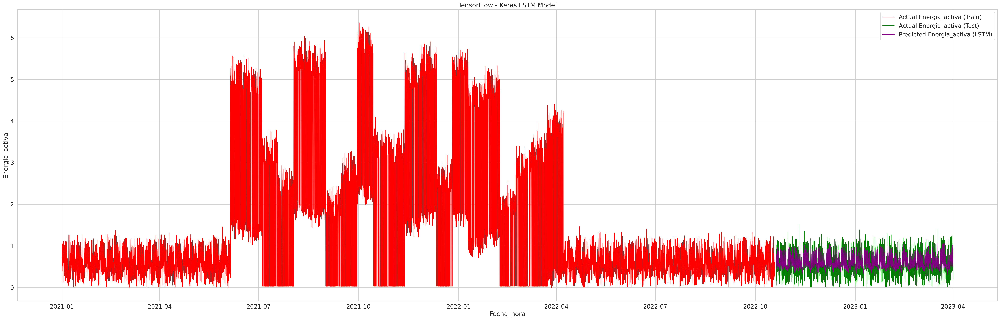

Explained Variance: 0.39469140293965366
MAE: 0.16646780102463385
RMSE: 0.20752087966203706
MSE: 0.04306491549570566
MAPE: 63.88467980640302


In [58]:
plt.figure(figsize=(50,15))
plt.title('TensorFlow - Keras LSTM Model')
plt.plot(train6_2, color='red', label='Actual Energia_activa (Train)')
plt.xlabel('Fecha_hora')
plt.ylabel('Energia_activa')
plt.plot(df_lstm_final6['Energia_activa'], color='green', label='Actual Energia_activa (Test)')
plt.plot(df_lstm_final6['Prediction'], color='purple', label='Predicted Energia_activa (LSTM)')
plt.legend()

plt.show()

report_metrics(df_lstm_final6['Energia_activa'].squeeze(), df_lstm_final6['Prediction'].squeeze())

## Cliente 17

In [59]:
# Model Architecture
lstm_model17 = keras.Sequential([
    LSTM(units=128,activation="tanh", input_shape=(X_train17.shape[1], X_train17.shape[2]), return_sequences=True),  # return_sequences=True if adding more LSTM layers
    Dropout(0.2),  # Optional: Dropout for regularization
    LSTM(units=64, activation="relu"),  # Additional LSTM Layer
    Dropout(0.2),  # Optional: Another dropout layer for regularization
    Dense(units=1)
])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [60]:
# Compile the model
lstm_model17.compile(
    loss='mean_squared_error',
    optimizer=keras.optimizers.Adam(0.001)
)

In [61]:
# Callbacks
early_stopping17 = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint17 = ModelCheckpoint('best_lstm_model1.keras', monitor='val_loss', save_best_only=True)

In [62]:
# Model Training
history = lstm_model17.fit(
    X_train17, y_train17,
    epochs=500,
    batch_size=24,
    validation_split=0.1,
    verbose=1,
    shuffle=False,
    callbacks=[early_stopping17, model_checkpoint17]
)

Epoch 1/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.0356 - val_loss: 8.7812e-04
Epoch 2/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.0285 - val_loss: 0.0010
Epoch 3/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0279 - val_loss: 6.9031e-04
Epoch 4/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.0270 - val_loss: 8.2261e-04
Epoch 5/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.0257 - val_loss: 6.7503e-04
Epoch 6/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.0270 - val_loss: 7.8105e-04
Epoch 7/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.0248 - val_loss: 8.1783e-04
Epoch 8/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.0246 - val_loss: 7.5005e-04
Epoch 9/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0237 - val_loss: 7.3801e-04
Epoch 10/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.0229 - val_loss: 7.0599e-04
Epoch 11/500
584/584 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.0223 - 

In [63]:
from sklearn.metrics import r2_score
predictions = lstm_model17.predict(X_test17)
score = r2_score(y_test17,predictions)
print("R-Squared Score of LSTM model",score)

122/122 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
R-Squared Score of LSTM model 0.7545109098848413


In [64]:
lstm_pred17 = lstm_model17.predict(X_test17)
df_lstm_final17 = test17[lstm_pred17.shape[0]*-1:].copy()
df_lstm_final17['Prediction'] = lstm_pred17[:,0]
df_reset_index17 = df_cliente17.reset_index()
df_lstm_final17['Fecha_hora'] = df_reset_index17['Fecha_hora']
df_lstm_final17 = df_lstm_final17.set_index(["Fecha_hora"], drop=True)

122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


In [65]:
df_lstm_final17['Energia_activa'] = scaler17.inverse_transform(df_lstm_final17['Energia_activa'].to_numpy().reshape(-1, 1))
df_lstm_final17['Prediction'] = scaler17.inverse_transform(df_lstm_final17['Prediction'].to_numpy().reshape(-1, 1))

In [66]:
train17_2 = train17.copy()
train17_2.index = df_cliente17.index[:len(train17)]
train17_2['Energia_activa'] = scaler17.inverse_transform(train17_2['Energia_activa'].to_numpy().reshape(-1, 1))
train17_2['Fecha_hora'] = df_cliente17['Fecha_hora']
train17_2 = train17_2.set_index(['Fecha_hora'])

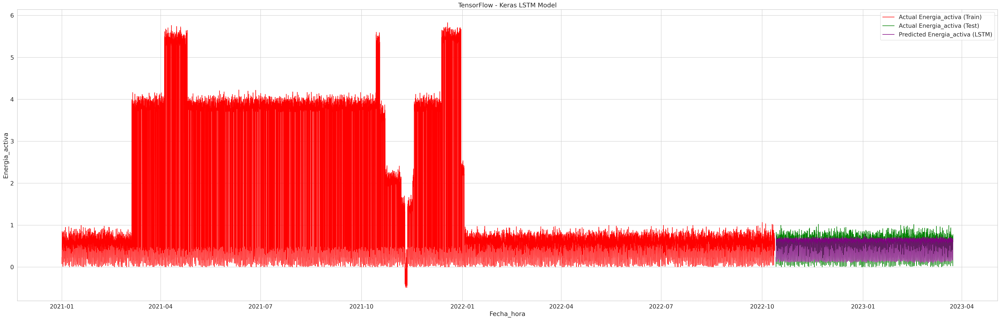

Explained Variance: 0.7548180622720329
MAE: 0.09255247391159205
RMSE: 0.11572041096389539
MSE: 0.01339121351365284
MAPE: 89.5610575837934


In [67]:
plt.figure(figsize=(50,15))
plt.title('TensorFlow - Keras LSTM Model')
plt.plot(train17_2, color='red', label='Actual Energia_activa (Train)')
plt.xlabel('Fecha_hora')
plt.ylabel('Energia_activa')
plt.plot(df_lstm_final17['Energia_activa'], color='green', label='Actual Energia_activa (Test)')
plt.plot(df_lstm_final17['Prediction'], color='purple', label='Predicted Energia_activa (LSTM)')
plt.legend()

plt.show()

report_metrics(df_lstm_final17['Energia_activa'].squeeze(), df_lstm_final17['Prediction'].squeeze())

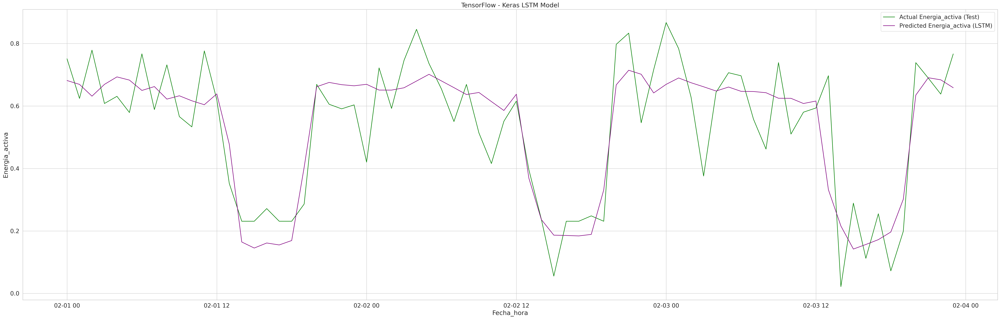

Explained Variance: 0.7548180622720329
MAE: 0.09255247391159205
RMSE: 0.11572041096389539
MSE: 0.01339121351365284
MAPE: 89.5610575837934


In [68]:
plt.figure(figsize=(50,15))
plt.title('TensorFlow - Keras LSTM Model')
plt.plot(df_lstm_final17['Energia_activa'].loc['2023-02-01':'2023-02-03'], color='green', label='Actual Energia_activa (Test)')
plt.plot(df_lstm_final17['Prediction'].loc['2023-02-01':'2023-02-03'], color='purple', label='Predicted Energia_activa (LSTM)')
plt.xlabel('Fecha_hora')
plt.ylabel('Energia_activa')
plt.legend()
plt.show()

report_metrics(df_lstm_final17['Energia_activa'].squeeze(), df_lstm_final17['Prediction'].squeeze())

In [69]:
from keras.models import load_model
# Guardar el modelo
lstm_model6.save('lstm_model6.h5')
lstm_model17.save('lstm_model17.h5')